In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

import warnings
warnings.filterwarnings("ignore")

In [2]:
##### Functions
# 1st function: to graph time series based on TransactionDT vs the variable selected

def scatter(column):
    fr,no_fr = (train[train['isFraud'] == 1], train[train['isFraud'] == 0])  
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15,3)) 
    ax1.title.set_text('Histogram ' + column + ' when isFraud == 0')
    ax1.set_ylim(train[column].min() - 1,train[column].max() + 1)
    ax1.scatter(x = no_fr['TransactionDT'], y = no_fr[column], color = 'blue', marker='o')   
    ax2.title.set_text('Histogram ' + column + ' when isFraud == 1')
    ax2.set_ylim(train[column].min() - 1,train[column].max() + 1)
    ax2.scatter(x = fr['TransactionDT'], y = fr[column], color = 'red', marker='o')
    plt.show()
    
# 2nd function: to show a ranking of pearson correlation with the variable selected

def corr(data,column):
    print('Correlation with ' + column)
    print(train[data].corrwith(train[column]).abs().sort_values(ascending = False)[1:])
    
# 3rd function: to reduce the groups based on Nans agroupation and pearson correlation

def reduce(groups):
    result = list()   
    for values in groups:
        maxval = 0
        val = values[0]  
        for value in values:
            unique_values = train[value].nunique()
            if unique_values > maxval:
                maxval = unique_values
                val = value 
        result.append(value)
    return result

# 4th function: to sort each column in ascending order based on its number

def order_finalcolumns(final_Xcolumns):
    return sorted(final_Xcolumns, key=lambda x: int("".join([i for i in x if i.isdigit()])))

In [3]:
##### Download of files.

print('Downloading datasets...')
print(' ')
train = pd.read_pickle('/kaggle/input/1-fraud-detection-memory-reduction/train_mred.pkl')
print('Train has been downloaded... (1/2)')
test = pd.read_pickle('/kaggle/input/1-fraud-detection-memory-reduction/test_mred.pkl')
print('Test has been downloaded... (2/2)')
print(' ')
print('All files are downloaded')

 
Train has been downloaded... (1/2)
Test has been downloaded... (2/2)
 
All files are downloaded


In [4]:
##### All the columns of train dataset.

print(list(train))

['TransactionID', 'isFraud', 'TransactionDT', 'TransactionAmt', 'ProductCD', 'card1', 'card2', 'card3', 'card4', 'card5', 'card6', 'addr1', 'addr2', 'dist1', 'dist2', 'P_emaildomain', 'R_emaildomain', 'C1', 'C2', 'C3', 'C4', 'C5', 'C6', 'C7', 'C8', 'C9', 'C10', 'C11', 'C12', 'C13', 'C14', 'D1', 'D2', 'D3', 'D4', 'D5', 'D6', 'D7', 'D8', 'D9', 'D10', 'D11', 'D12', 'D13', 'D14', 'D15', 'M1', 'M2', 'M3', 'M4', 'M5', 'M6', 'M7', 'M8', 'M9', 'V1', 'V2', 'V3', 'V4', 'V5', 'V6', 'V7', 'V8', 'V9', 'V10', 'V11', 'V12', 'V13', 'V14', 'V15', 'V16', 'V17', 'V18', 'V19', 'V20', 'V21', 'V22', 'V23', 'V24', 'V25', 'V26', 'V27', 'V28', 'V29', 'V30', 'V31', 'V32', 'V33', 'V34', 'V35', 'V36', 'V37', 'V38', 'V39', 'V40', 'V41', 'V42', 'V43', 'V44', 'V45', 'V46', 'V47', 'V48', 'V49', 'V50', 'V51', 'V52', 'V53', 'V54', 'V55', 'V56', 'V57', 'V58', 'V59', 'V60', 'V61', 'V62', 'V63', 'V64', 'V65', 'V66', 'V67', 'V68', 'V69', 'V70', 'V71', 'V72', 'V73', 'V74', 'V75', 'V76', 'V77', 'V78', 'V79', 'V80', 'V81', 'V

# NaNs Exploration
We will search all the columns to determine which columns are related by the number of NANs present. After grouping them, we decide to keep the columns of each group with major amount of unique values (its supposed to be the most explanatory variable)

## Transaction columns

In [5]:
# These columns are the first ones in transaction dataset.

columns= list(train.columns[:17])
columns

['TransactionID',
 'isFraud',
 'TransactionDT',
 'TransactionAmt',
 'ProductCD',
 'card1',
 'card2',
 'card3',
 'card4',
 'card5',
 'card6',
 'addr1',
 'addr2',
 'dist1',
 'dist2',
 'P_emaildomain',
 'R_emaildomain']

In [6]:
for col in columns:
    print(f'{col} NaNs: {train[col].isna().sum()} | {train[col].isna().sum()/train.shape[0]:.2%}')

TransactionID NaNs: 0 | 0.00%
isFraud NaNs: 0 | 0.00%
TransactionDT NaNs: 0 | 0.00%
TransactionAmt NaNs: 0 | 0.00%
ProductCD NaNs: 0 | 0.00%
card1 NaNs: 0 | 0.00%
card2 NaNs: 8933 | 1.51%
card3 NaNs: 1565 | 0.27%
card4 NaNs: 1577 | 0.27%
card5 NaNs: 4259 | 0.72%
card6 NaNs: 1571 | 0.27%
addr1 NaNs: 65706 | 11.13%
addr2 NaNs: 65706 | 11.13%
dist1 NaNs: 352271 | 59.65%
dist2 NaNs: 552913 | 93.63%
P_emaildomain NaNs: 94456 | 15.99%
R_emaildomain NaNs: 453249 | 76.75%


In [7]:
# If we look closely to % NaNs data, most of them have low number of missing information. We are keeping all the columns where % NaNs < 0.7

final_transactioncolumns = list()
for col in columns:
    if train[col].isna().sum()/train.shape[0] < 0.7:
        final_transactioncolumns.append(col)
print('Final Transaction columns:',final_transactioncolumns)

Final Transaction columns: ['TransactionID', 'isFraud', 'TransactionDT', 'TransactionAmt', 'ProductCD', 'card1', 'card2', 'card3', 'card4', 'card5', 'card6', 'addr1', 'addr2', 'dist1', 'P_emaildomain']


## C columns

In [8]:
##### Group the C columns to determine which columns are related by the number of NANs present and analyze its groups independently.

columns = ['C' + str(i) for i in range(1,15)]
df_nan = train.isna()
dict_nans = dict()

for column in columns:
    number_nans = df_nan[column].sum()
    try:
        dict_nans[number_nans].append(column)
    except:
        dict_nans[number_nans] = [column]

group_number = 1
for key,values in dict_nans.items():
    print('Group {}'.format(group_number),'| Number of NANs =',key)
    print(values)
    print(' ')
    group_number += 1

Group 1 | Number of NANs = 0
['C1', 'C2', 'C3', 'C4', 'C5', 'C6', 'C7', 'C8', 'C9', 'C10', 'C11', 'C12', 'C13', 'C14']
 


### Group 1 (single group)

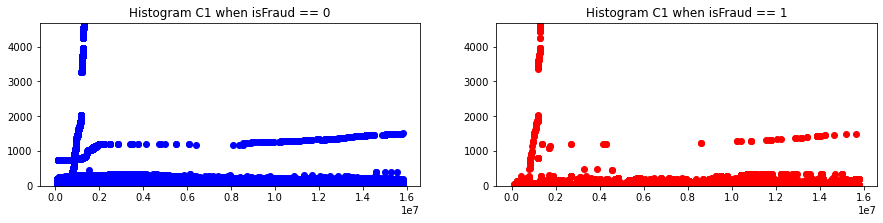

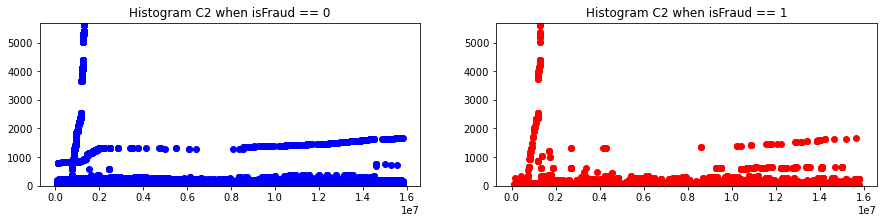

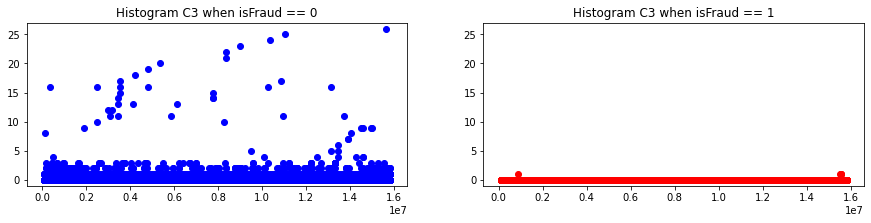

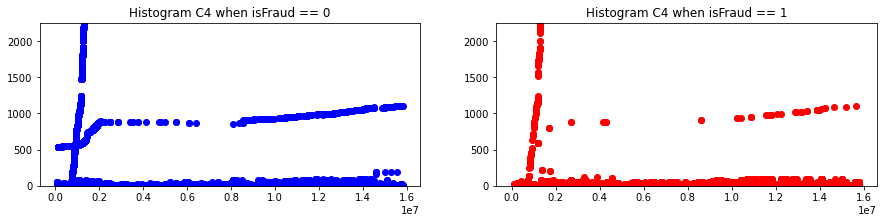

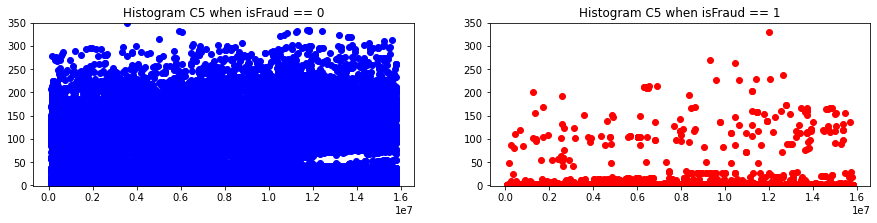

...

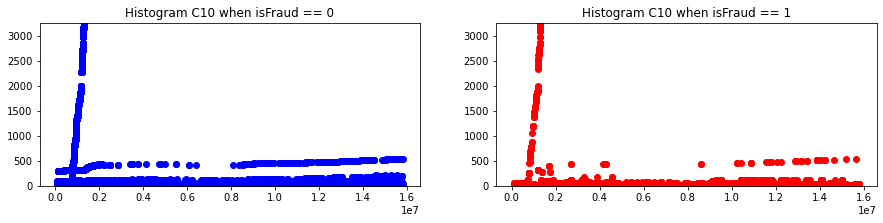

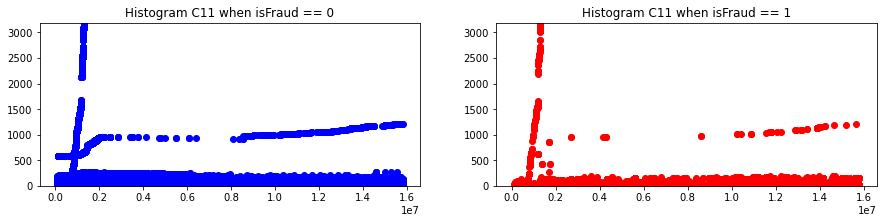

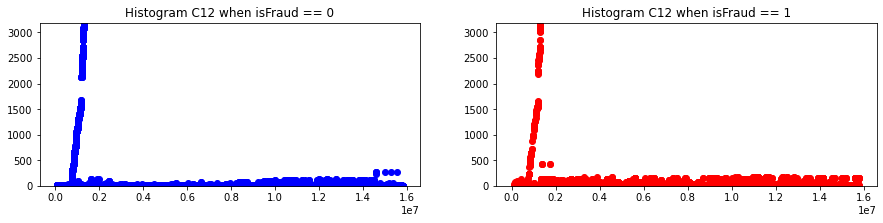

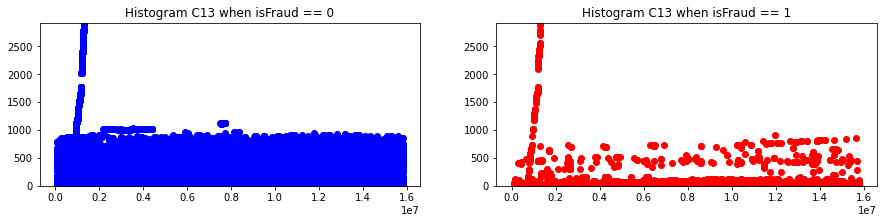

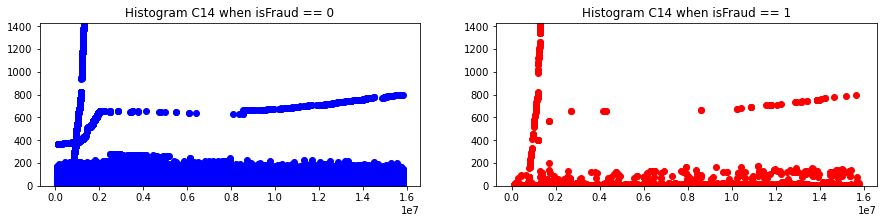

In [9]:
##### Time series graph based on TransactionDT
# There is no column that does not have NaNs values so we get all the columns in the same group

group_list = ['C1', 'C2', 'C3', 'C4', 'C5', 'C6', 'C7', 'C8', 'C9', 'C10', 'C11', 'C12', 'C13', 'C14']

for column in group_list:
    scatter(column)

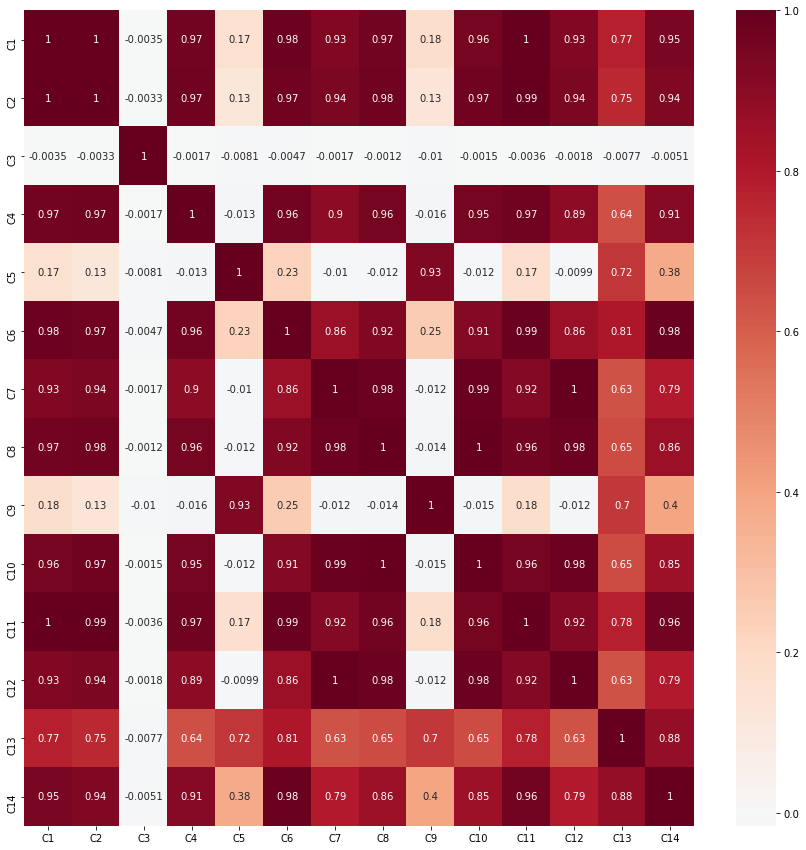

In [10]:
##### Heatmap

plt.figure(figsize = (15,15))
sns.heatmap(train[group_list].corr(), cmap='RdBu_r', annot=True, center=0.0)
plt.show()

In [11]:
##### Ranking of pearson correlation.

for column in group_list:
    corr(group_list,column)
    print(' ')

Correlation with C1
C11    0.996515
C2     0.995089
C6     0.982238
C4     0.967800
C8     0.967746
C10    0.958202
C14    0.951761
C12    0.927939
C7     0.926258
C13    0.774603
C9     0.175999
C5     0.165862
C3     0.003467
dtype: float64
 
Correlation with C2
C1     0.995089
C11    0.993898
C8     0.975863
C6     0.974845
C4     0.972134
C10    0.970624
C12    0.940258
C7     0.938867
C14    0.936148
C13    0.751221
C9     0.133566
C5     0.126540
C3     0.003339
dtype: float64
 
Correlation with C3
C9     0.010074
C5     0.008101
C13    0.007747
C14    0.005091
C6     0.004711
C11    0.003583
C1     0.003467
C2     0.003339
C12    0.001763
C7     0.001730
C4     0.001720
C10    0.001494
C8     0.001203
dtype: float64
 
Correlation with C4
C11    0.974547
C2     0.972134
C1     0.967800
C6     0.962319
C8     0.959995
C10    0.952466
C14    0.907676
C7     0.895092
C12    0.894619
C13    0.644549
C9     0.015970
C5     0.012842
C3     0.001720
dtype: float64
 
Correlation with C5


In [12]:
##### Based on pearson correlation, we grouped together the columns with corr > 0.7

reduce_groups = [['C1','C11','C2','C6','C8','C4','C10','C14','C12','C7','C13'], ['C3'], ['C5','C9']]
                 
result = reduce(reduce_groups)
print('Final C columns:',result)
final_ccolumns = result

Final C columns: ['C13', 'C3', 'C9']


## D columns

In [13]:
##### Group the D columns + Dachr columns to determine which columns are related by the number of NANs present and analyze its groups independently.

columns = ['D' + str(i) for i in range(1,16)]
columns.extend(['D1achr','D2achr','D4achr','D6achr','D10achr','D11achr','D12achr','D13achr','D14achr','D15achr'])
df_nan = train.isna()
dict_nans = dict()

for column in columns:
    number_nans = df_nan[column].sum()
    try:
        dict_nans[number_nans].append(column)
    except:
        dict_nans[number_nans] = [column]

group_number = 1
for key,values in dict_nans.items():
    print('Group {}'.format(group_number),'| Number of NANs =',key)
    print(values)
    print(' ')
    group_number += 1

Group 1 | Number of NANs = 1269
['D1', 'D1achr']
 
Group 2 | Number of NANs = 280797
['D2', 'D2achr']
 
Group 3 | Number of NANs = 262878
['D3']
 
Group 4 | Number of NANs = 168922
['D4', 'D4achr']
 
Group 5 | Number of NANs = 309841
['D5']
 
Group 6 | Number of NANs = 517353
['D6', 'D6achr']
 
Group 7 | Number of NANs = 551623
['D7']
 
Group 8 | Number of NANs = 515614
['D8', 'D9']
 
Group 9 | Number of NANs = 76022
['D10', 'D10achr']
 
Group 10 | Number of NANs = 279287
['D11', 'D11achr']
 
Group 11 | Number of NANs = 525823
['D12', 'D12achr']
 
Group 12 | Number of NANs = 528588
['D13', 'D13achr']
 
Group 13 | Number of NANs = 528353
['D14', 'D14achr']
 
Group 14 | Number of NANs = 89113
['D15', 'D15achr']
 


### Group 1 (single group)

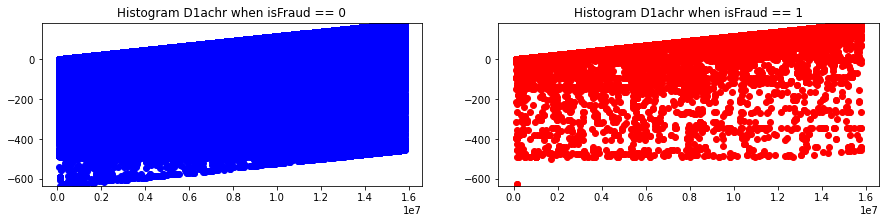

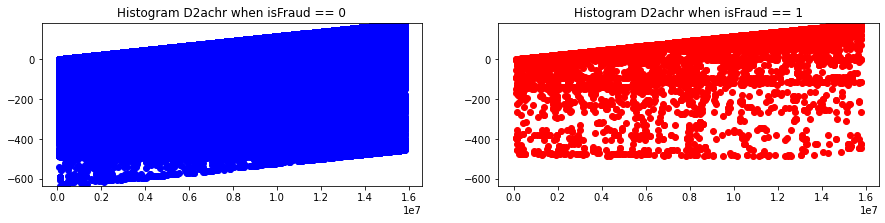

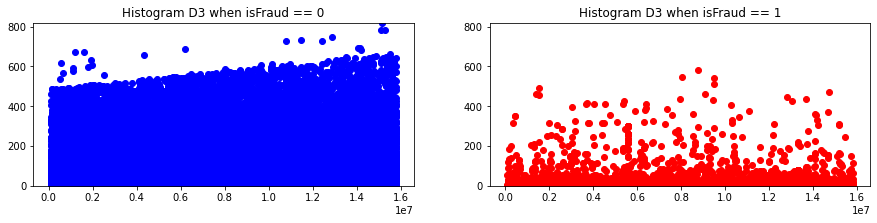

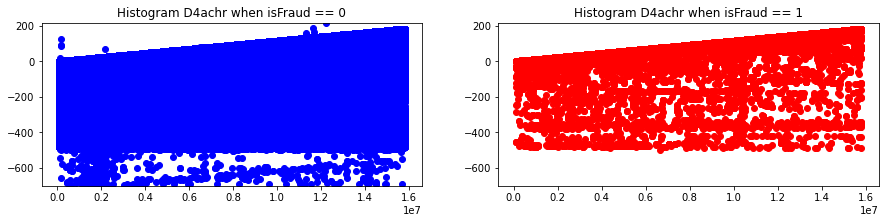

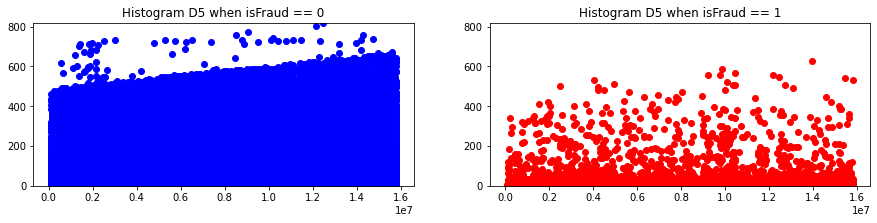

...

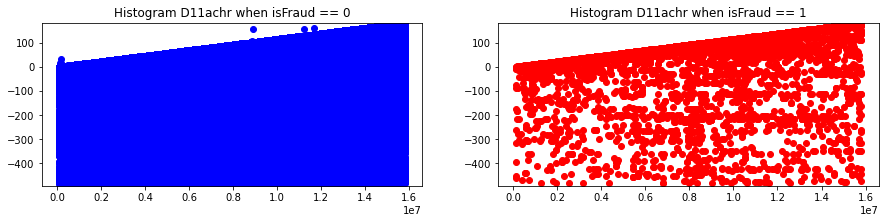

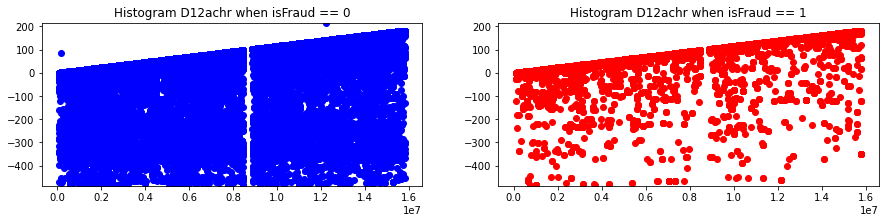

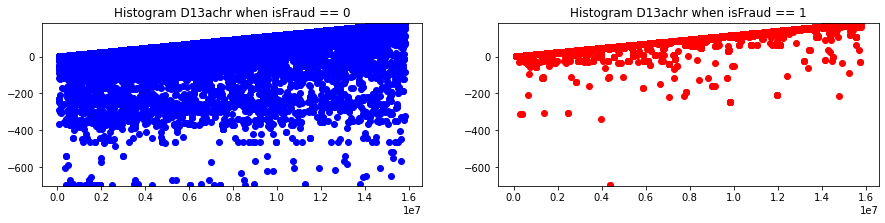

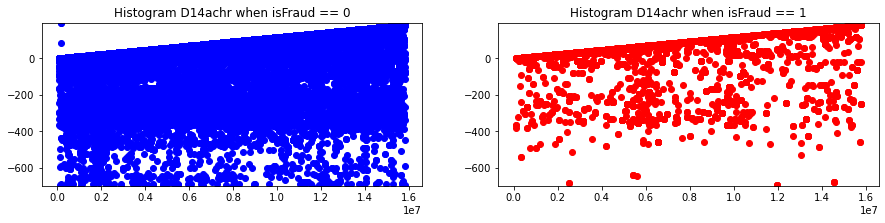

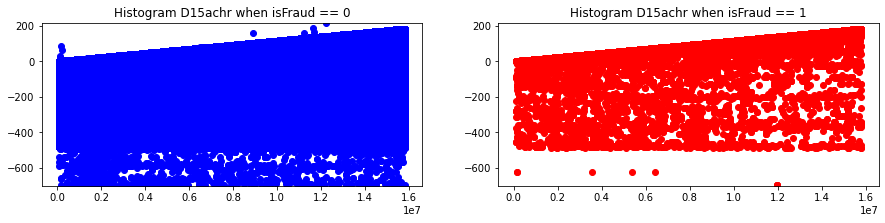

In [14]:
##### Time series graph based on TransactionDT.
# Despite having different number of NaNs, we are analyzing it as a single group. But due to NaNs low number in D1, we keep it as a final column.

group_list = ['D1achr', 'D2achr', 'D3', 'D4achr', 'D5', 'D6achr', 'D7', 'D8', 'D9', 'D10achr', 'D11achr', 'D12achr', 'D13achr', 'D14achr', 'D15achr']

for column in group_list:
    scatter(column)

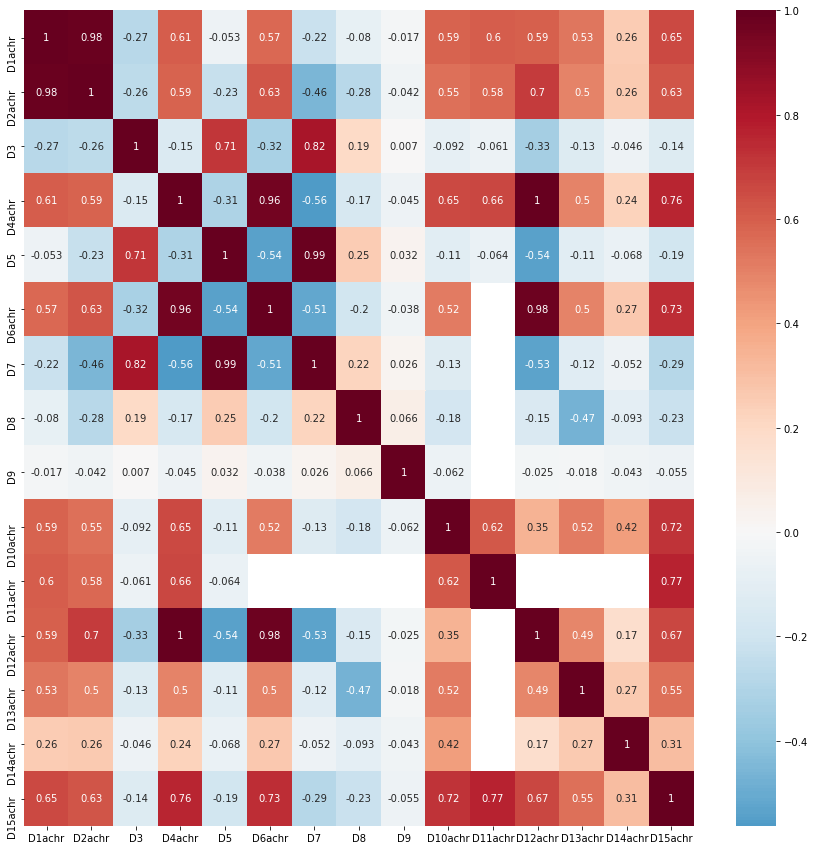

In [15]:
##### Heatmap

plt.figure(figsize = (15,15))
sns.heatmap(train[group_list].corr(), cmap='RdBu_r', annot=True, center=0.0)
plt.show()

In [16]:
##### Ranking of pearson correlation.

for column in group_list:
    corr(group_list,column)
    print(' ')

Correlation with D1achr
D2achr     0.982530
D15achr    0.653062
D4achr     0.606567
D11achr    0.604219
D12achr    0.592222
D10achr    0.586844
D6achr     0.574589
D13achr    0.530733
D3         0.273070
D14achr    0.255041
D7         0.217496
D8         0.079708
D5         0.052954
D9         0.017225
dtype: float64
 
Correlation with D2achr
D1achr     0.982530
D12achr    0.700269
D15achr    0.633600
D6achr     0.630681
D4achr     0.590069
D11achr    0.577879
D10achr    0.551223
D13achr    0.497506
D7         0.456042
D8         0.276786
D3         0.259608
D14achr    0.258755
D5         0.231921
D9         0.042302
dtype: float64
 
Correlation with D3
D7         0.818080
D5         0.707425
D12achr    0.334355
D6achr     0.320157
D1achr     0.273070
D2achr     0.259608
D8         0.194211
D4achr     0.146627
D15achr    0.140352
D13achr    0.134597
D10achr    0.091687
D11achr    0.060544
D14achr    0.046498
D9         0.006984
dtype: float64
 
Correlation with D4achr
D12achr    1.0000

In [17]:
##### Based on pearson correlation, we grouped together the columns with corr > 0.7
# On the first group, D1achr vs D2achr --> we keep D1achr due to the low number of NaNs.

reduce_groups = [['D3','D7','D5'],['D4achr','D12achr','D6achr','D15achr','D10achr', 'D11achr'], ['D8'], ['D9'], ['D13achr'],['D14achr']]
                 
result = reduce(reduce_groups)
result.append('D1achr')
print('Final D columns:',result)
final_dcolumns = result

Final D columns: ['D5', 'D11achr', 'D8', 'D9', 'D13achr', 'D14achr', 'D1achr']


## M columns

In [18]:
##### Group the M columns to determine which columns are related by the number of NANs present and analyze its groups independently.

columns = ['M' + str(i) for i in range(1,10)]
df_nan = train.isna()
dict_nans = dict()

for column in columns:
    number_nans = df_nan[column].sum()
    try:
        dict_nans[number_nans].append(column)
    except:
        dict_nans[number_nans] = [column]

group_number = 1
for key,values in dict_nans.items():
    print('Group {}'.format(group_number),'| Number of NANs =',key)
    print(values)
    print(' ')
    group_number += 1

Group 1 | Number of NANs = 271100
['M1', 'M2', 'M3']
 
Group 2 | Number of NANs = 281444
['M4']
 
Group 3 | Number of NANs = 350482
['M5']
 
Group 4 | Number of NANs = 169360
['M6']
 
Group 5 | Number of NANs = 346265
['M7']
 
Group 6 | Number of NANs = 346252
['M8', 'M9']
 


### Group 1 (single group)

In [19]:
# To analize M columns, we need to transform strings to numbers. Instead of using Label Encoder, we use a dictionary.

T_F_num = dict({'F': 0, 'T': 1, 'M0': 0, 'M1': 1, 'M2': 2})

for column in ['M1', 'M2', 'M3', 'M4', 'M5', 'M6', 'M7', 'M8', 'M9']:
    print(f'{column}:', train[column].unique())
    print('Transforming strings to numbers...')
    train[column] = train[column].replace(T_F_num)
    print(f'{column}:', train[column].unique())
    print('')

M1: ['T' nan 'F']
Transforming strings to numbers...
M1: [ 1. nan  0.]

M2: ['T' nan 'F']
Transforming strings to numbers...
M2: [ 1. nan  0.]

M3: ['T' nan 'F']
Transforming strings to numbers...
M3: [ 1. nan  0.]

M4: ['M2' 'M0' nan 'M1']
Transforming strings to numbers...
M4: [ 2.  0. nan  1.]

M5: ['F' 'T' nan]
Transforming strings to numbers...
M5: [ 0.  1. nan]

M6: ['T' 'F' nan]
Transforming strings to numbers...
M6: [ 1.  0. nan]

M7: [nan 'F' 'T']
Transforming strings to numbers...
M7: [nan  0.  1.]

M8: [nan 'F' 'T']
Transforming strings to numbers...
M8: [nan  0.  1.]

M9: [nan 'F' 'T']
Transforming strings to numbers...
M9: [nan  0.  1.]



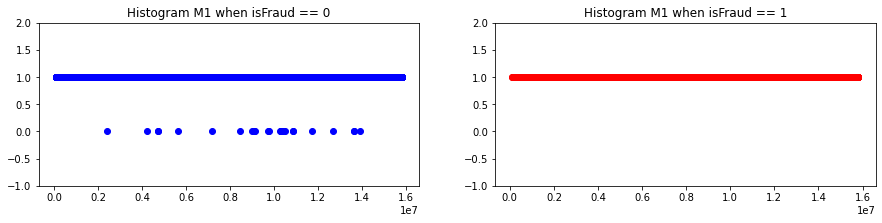

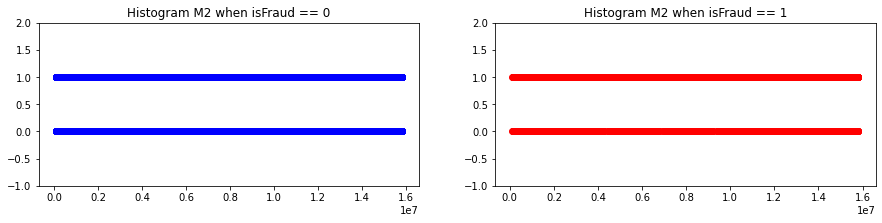

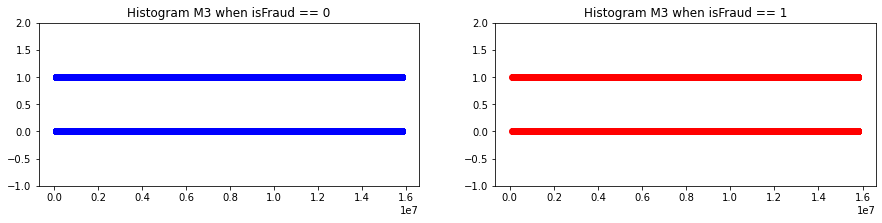

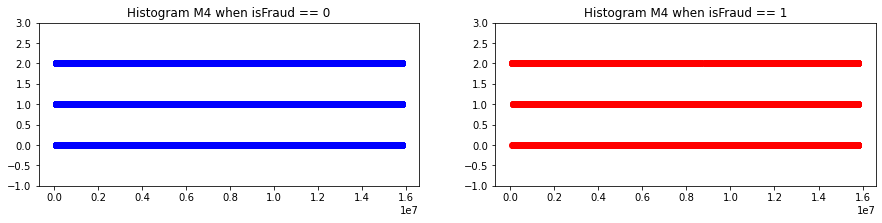

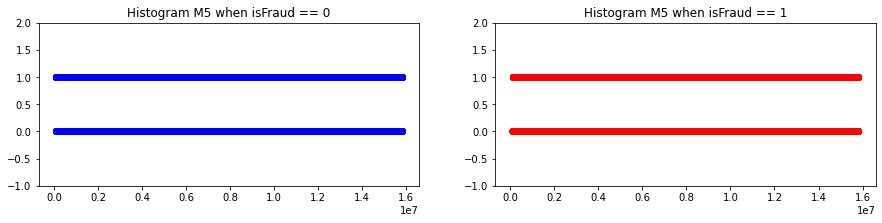

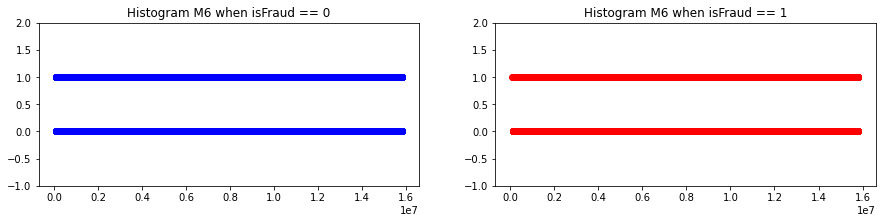

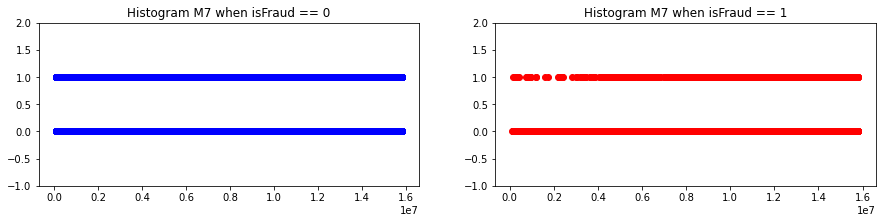

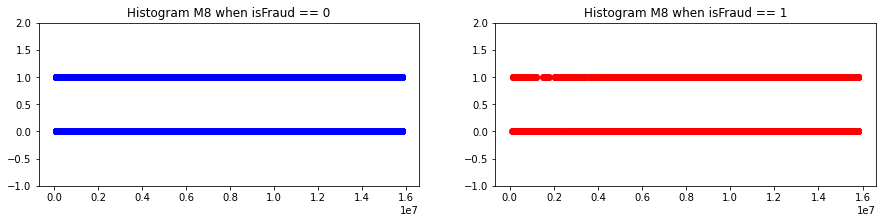

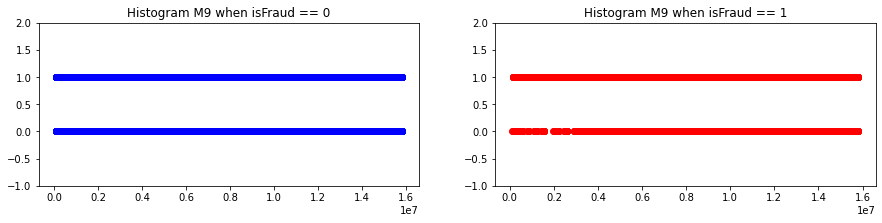

In [20]:
##### Time series graph based on TransactionDT.
# Despite having different number of NaNs, we are analyzing it as a single group.

group_list = ['M1', 'M2', 'M3', 'M4', 'M5', 'M6', 'M7', 'M8', 'M9']

for column in group_list:
    scatter(column)

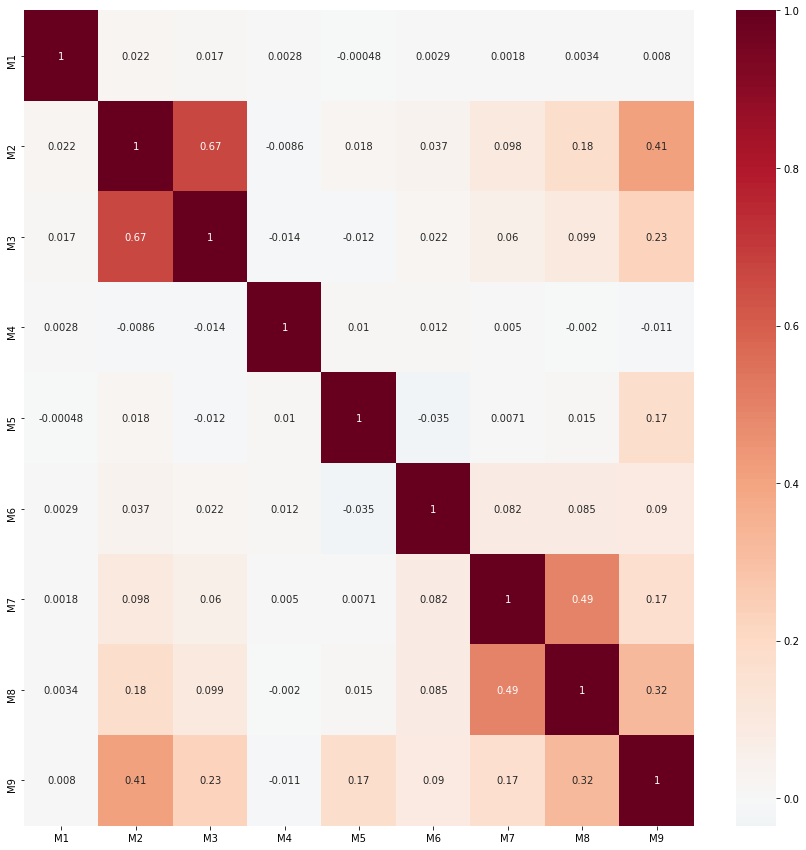

In [21]:
##### Heatmap

plt.figure(figsize = (15,15))
sns.heatmap(train[group_list].corr(), cmap='RdBu_r', annot=True, center=0.0)
plt.show()

In [22]:
#### Ranking of pearson correlation.

for column in group_list:
    corr(group_list,column)
    print(' ')

Correlation with M1
M2    0.022202
M3    0.017058
M9    0.008035
M8    0.003438
M6    0.002873
M4    0.002807
M7    0.001790
M5    0.000482
dtype: float64
 
Correlation with M2
M3    0.665161
M9    0.408110
M8    0.177217
M7    0.098407
M6    0.037023
M1    0.022202
M5    0.017961
M4    0.008642
dtype: float64
 
Correlation with M3
M2    0.665161
M9    0.232560
M8    0.098663
M7    0.060444
M6    0.021657
M1    0.017058
M4    0.014191
M5    0.011867
dtype: float64
 
Correlation with M4
M3    0.014191
M6    0.011648
M9    0.010852
M5    0.010015
M2    0.008642
M7    0.004961
M1    0.002807
M8    0.002009
dtype: float64
 
Correlation with M5
M9    0.171504
M6    0.035068
M2    0.017961
M8    0.015034
M3    0.011867
M4    0.010015
M7    0.007124
M1    0.000482
dtype: float64
 
Correlation with M6
M9    0.090393
M8    0.084646
M7    0.082266
M2    0.037023
M5    0.035068
M3    0.021657
M4    0.011648
M1    0.002873
dtype: float64
 
Correlation with M7
M8    0.493290
M9    0.169445
M2    0.

In [23]:
##### Based on pearson correlation, We grouped together the columns with corr > 0.7 but in this case, no correlation is bigger than 0.7
# That's why, in this particular case we grouped together the columns with corr > 0.5

reduce_groups = ['M1'], ['M2','M3'], ['M4'], ['M5'], ['M6'], ['M7', 'M8'], ['M9']
                 
result = reduce(reduce_groups)
print('Final M columns:',result)
final_mcolumns = result

Final M columns: ['M1', 'M3', 'M4', 'M5', 'M6', 'M8', 'M9']


## V columns

In [24]:
##### Group the V columns to determine which columns are related by the number of NANs present and analyze its groups independently.

columns = ['V' + str(i) for i in range(1,340)]
df_nan = train.isna()
dict_nans = dict()

for column in columns:
    number_nans = df_nan[column].sum()
    try:
        dict_nans[number_nans].append(column)
    except:
        dict_nans[number_nans] = [column]

group_number = 1
for key,values in dict_nans.items():
    print('Group {}'.format(group_number),'| Number of NANs =',key)
    print(values)
    print(' ')
    group_number += 1
    
final_vcolumns = list()

Group 1 | Number of NANs = 279287
['V1', 'V2', 'V3', 'V4', 'V5', 'V6', 'V7', 'V8', 'V9', 'V10', 'V11']
 
Group 2 | Number of NANs = 76073
['V12', 'V13', 'V14', 'V15', 'V16', 'V17', 'V18', 'V19', 'V20', 'V21', 'V22', 'V23', 'V24', 'V25', 'V26', 'V27', 'V28', 'V29', 'V30', 'V31', 'V32', 'V33', 'V34']
 
Group 3 | Number of NANs = 168969
['V35', 'V36', 'V37', 'V38', 'V39', 'V40', 'V41', 'V42', 'V43', 'V44', 'V45', 'V46', 'V47', 'V48', 'V49', 'V50', 'V51', 'V52']
 
Group 4 | Number of NANs = 77096
['V53', 'V54', 'V55', 'V56', 'V57', 'V58', 'V59', 'V60', 'V61', 'V62', 'V63', 'V64', 'V65', 'V66', 'V67', 'V68', 'V69', 'V70', 'V71', 'V72', 'V73', 'V74']
 
Group 5 | Number of NANs = 89164
['V75', 'V76', 'V77', 'V78', 'V79', 'V80', 'V81', 'V82', 'V83', 'V84', 'V85', 'V86', 'V87', 'V88', 'V89', 'V90', 'V91', 'V92', 'V93', 'V94']
 
Group 6 | Number of NANs = 314
['V95', 'V96', 'V97', 'V98', 'V99', 'V100', 'V101', 'V102', 'V103', 'V104', 'V105', 'V106', 'V107', 'V108', 'V109', 'V110', 'V111', 'V112'

### Group 1

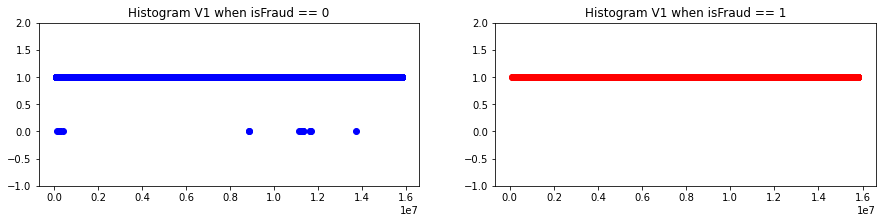

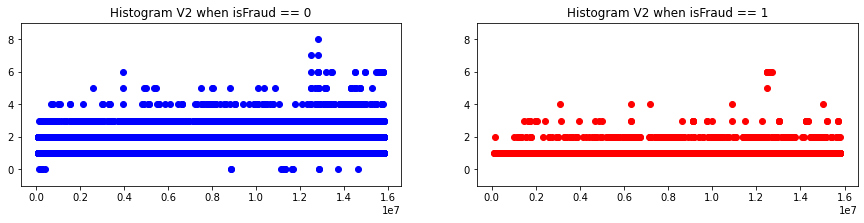

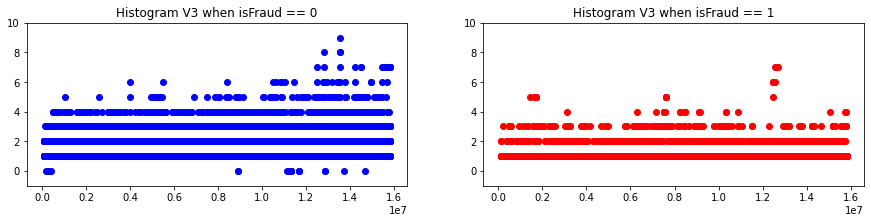

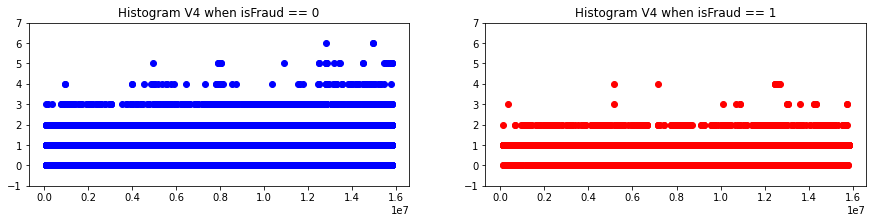

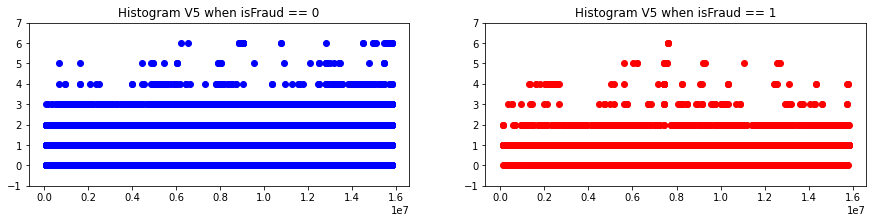

...

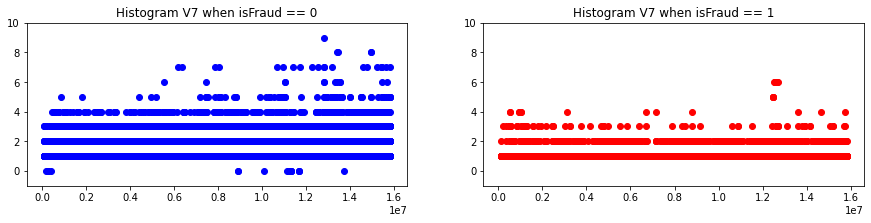

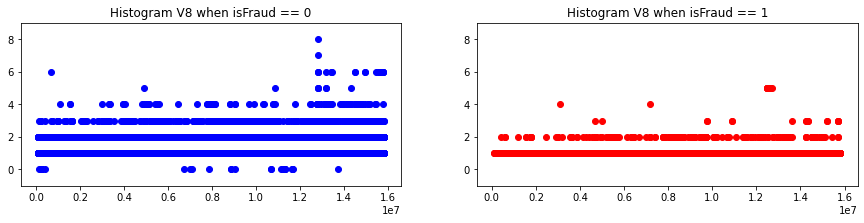

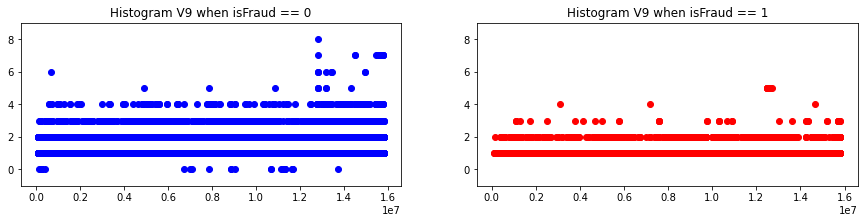

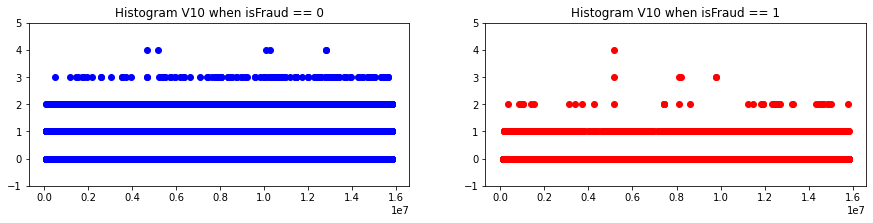

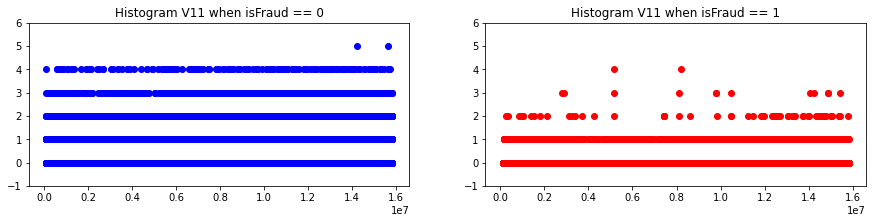

In [25]:
##### Time series graph based on TransactionDT.
group_list = ['V1', 'V2', 'V3', 'V4', 'V5', 'V6', 'V7', 'V8', 'V9', 'V10', 'V11']

for column in group_list:
    scatter(column)

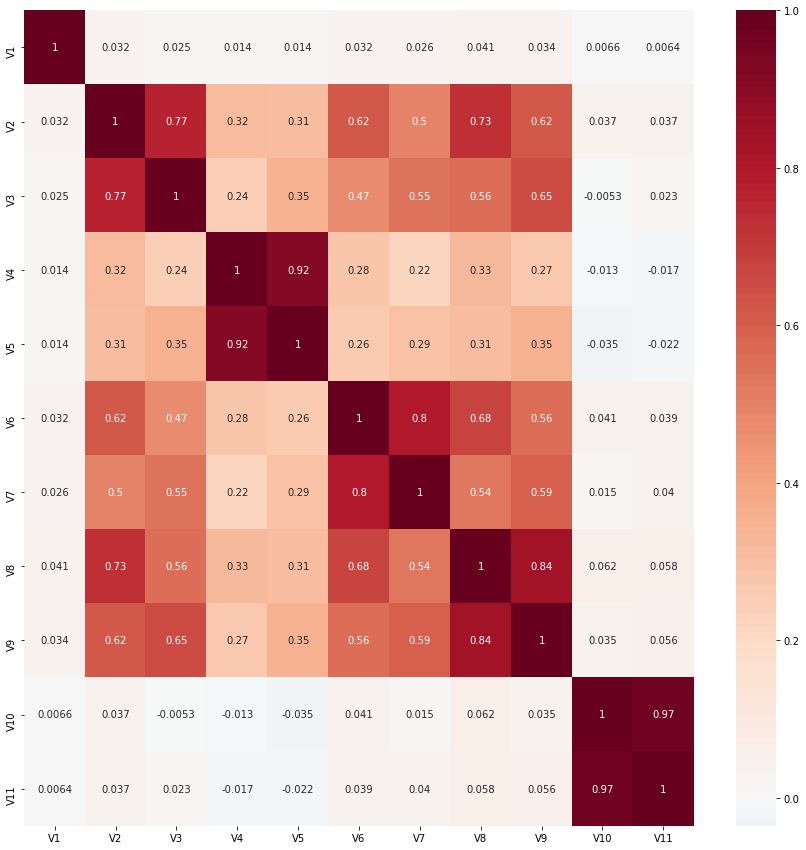

In [26]:
##### Heatmap

plt.figure(figsize = (15,15))
sns.heatmap(train[group_list].corr(), cmap='RdBu_r', annot=True, center=0.0)
plt.show()

In [27]:
##### Ranking of pearson correlation.

for column in group_list:
    corr(group_list,column)
    print(' ')

Correlation with V1
V8     0.040820
V9     0.034009
V6     0.032284
V2     0.032168
V7     0.026016
V3     0.024830
V4     0.014216
V5     0.013619
V10    0.006574
V11    0.006408
dtype: float64
 
Correlation with V2
V3     0.773039
V8     0.732730
V6     0.621459
V9     0.618591
V7     0.496921
V4     0.318554
V5     0.305504
V11    0.037459
V10    0.036884
V1     0.032168
dtype: float64
 
Correlation with V3
V2     0.773039
V9     0.653087
V8     0.556536
V7     0.546875
V6     0.472570
V5     0.353767
V4     0.243684
V1     0.024830
V11    0.022911
V10    0.005272
dtype: float64
 
Correlation with V4
V5     0.915164
V8     0.325873
V2     0.318554
V6     0.279596
V9     0.273207
V3     0.243684
V7     0.221621
V11    0.016662
V1     0.014216
V10    0.013160
dtype: float64
 
Correlation with V5
V4     0.915164
V9     0.354257
V3     0.353767
V8     0.308716
V2     0.305504
V7     0.294447
V6     0.261490
V10    0.035405
V11    0.021949
V1     0.013619
dtype: float64
 
Correlation wit

In [28]:
##### Based on pearson correlation, we grouped together the columns with corr > 0.7

reduce_groups = ['V1'], ['V2','V3'], ['V4','V5'], ['V6','V7'], ['V8','V9']

result = reduce(reduce_groups)
final_vcolumns.extend(result)
print('Final V_Group1 columns:',result)

Final V_Group1 columns: ['V1', 'V3', 'V5', 'V7', 'V9']


### Group 2

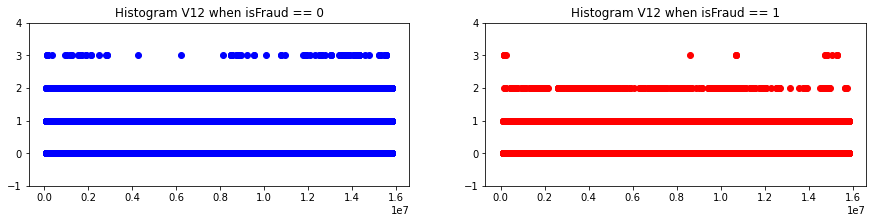

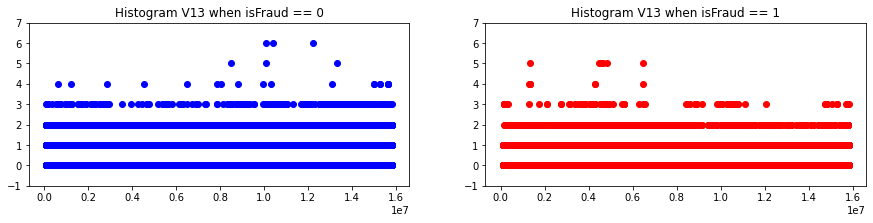

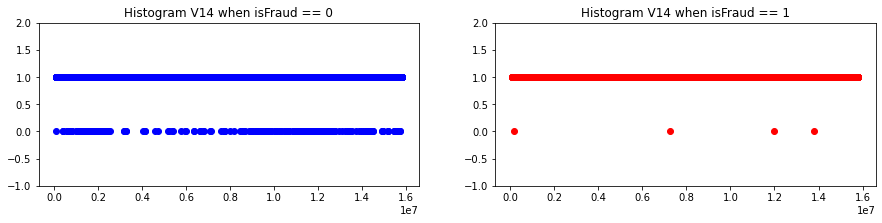

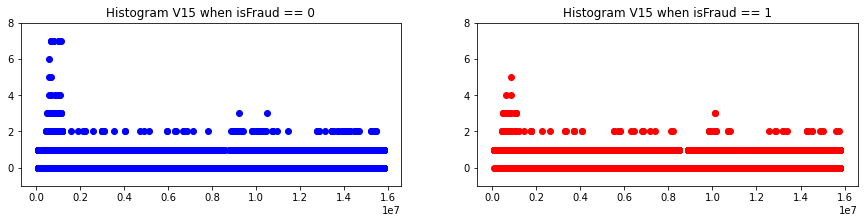

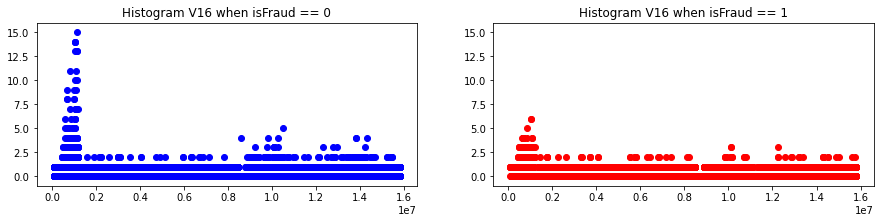

...

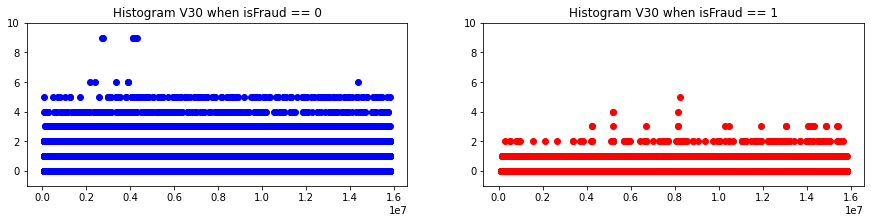

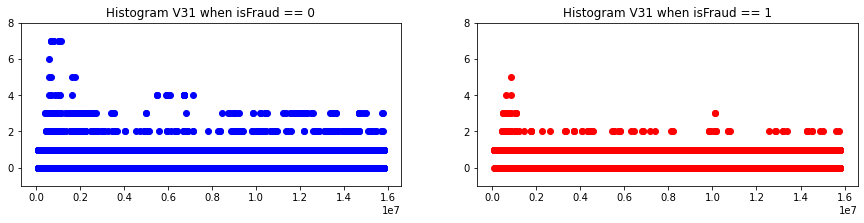

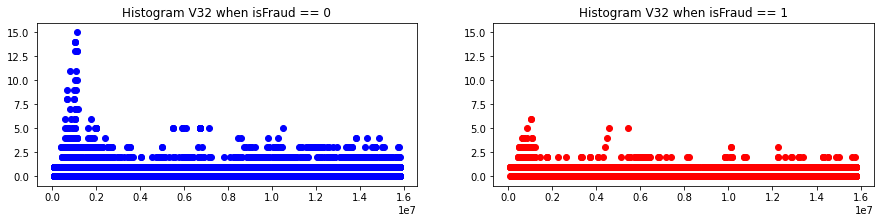

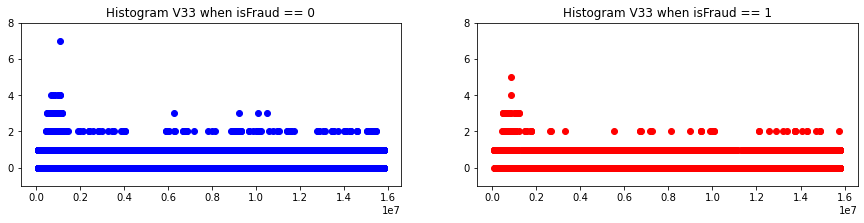

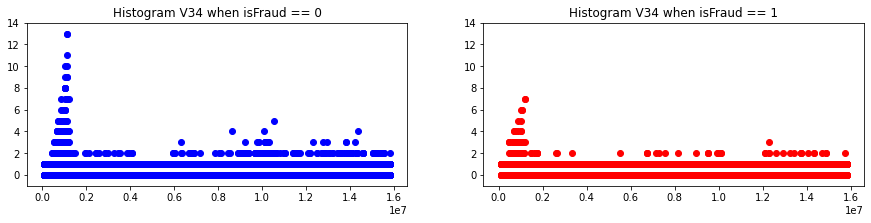

In [29]:
##### Time series graph based on TransactionDT.

group_list = ['V12', 'V13', 'V14', 'V15', 'V16', 'V17', 'V18', 'V19', 'V20', 'V21', 'V22', 'V23', 'V24', 'V25', 'V26', 'V27',
              'V28', 'V29', 'V30', 'V31', 'V32', 'V33', 'V34']

for column in group_list:
    scatter(column)

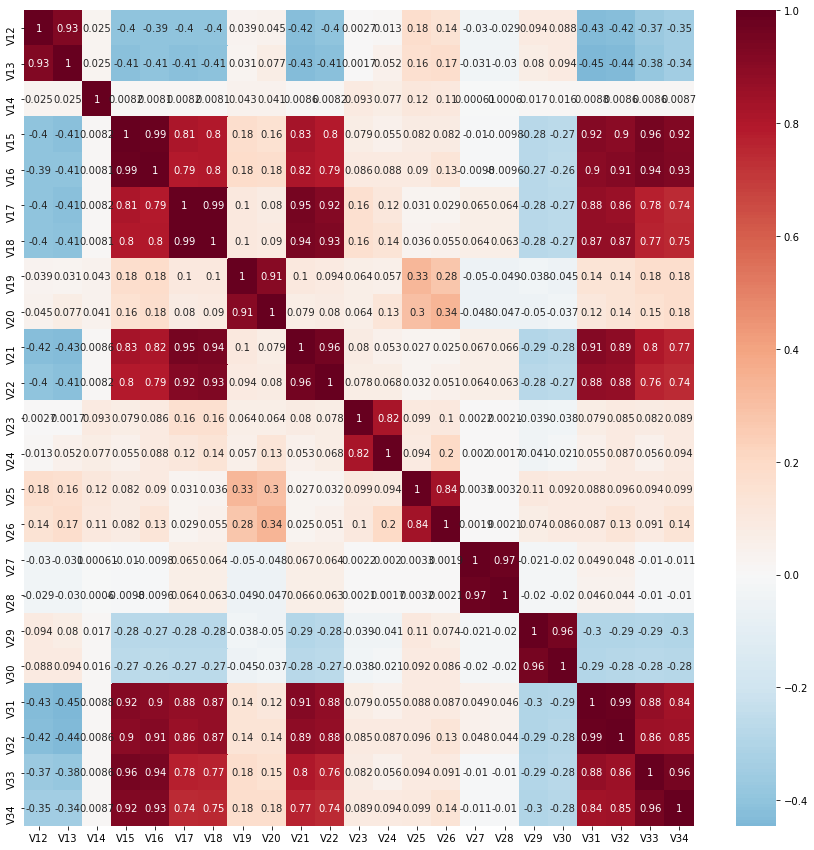

In [30]:
##### Heatmap

plt.figure(figsize = (15,15))
sns.heatmap(train[group_list].corr(), cmap='RdBu_r', annot=True, center=0.0)
plt.show()

In [31]:
##### Ranking of pearson correlation.

for column in group_list:
    corr(group_list,column)
    print(' ')

Correlation with V12
V13    0.925848
V31    0.433737
V32    0.423963
V21    0.419325
V22    0.403534
V15    0.403485
V17    0.403208
V18    0.399186
V16    0.394797
V33    0.369410
V34    0.347316
V25    0.179648
V26    0.143831
V29    0.093699
V30    0.088010
V20    0.045446
V19    0.039445
V27    0.029734
V28    0.029228
V14    0.024510
V24    0.013308
V23    0.002717
dtype: float64
 
Correlation with V13
V12    0.925848
V31    0.445421
V32    0.435384
V21    0.430620
V22    0.414404
V15    0.414354
V17    0.414069
V18    0.409940
V16    0.405432
V33    0.380500
V34    0.344989
V26    0.173050
V25    0.163081
V30    0.093814
V29    0.079542
V20    0.077315
V24    0.051561
V19    0.030745
V27    0.030535
V28    0.030015
V14    0.025170
V23    0.001674
dtype: float64
 
Correlation with V14
V25    0.117988
V26    0.105535
V23    0.093402
V24    0.077434
V19    0.042892
V20    0.041255
V13    0.025170
V12    0.024510
V29    0.016979
V30    0.016392
V31    0.008845
V34    0.008701
V32    

In [32]:
##### Based on pearson correlation, we grouped together the columns with corr > 0.7

reduce_groups = [['V12','V13'], ['V14'], ['V15','V16','V33','V34','V31','V32','V21','V22','V17','V18'], ['V19','V20'],['V23','V24'],['V25','V26'],['V27','V28'],['V29','V30']]

result = reduce(reduce_groups)
final_vcolumns.extend(result)
print('Final V_Group2 columns:',result)

Final V_Group2 columns: ['V13', 'V14', 'V18', 'V20', 'V24', 'V26', 'V28', 'V30']


### Group 3

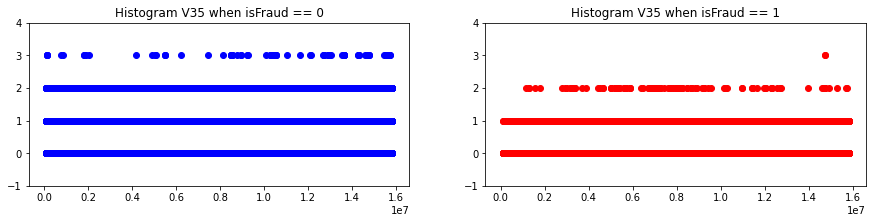

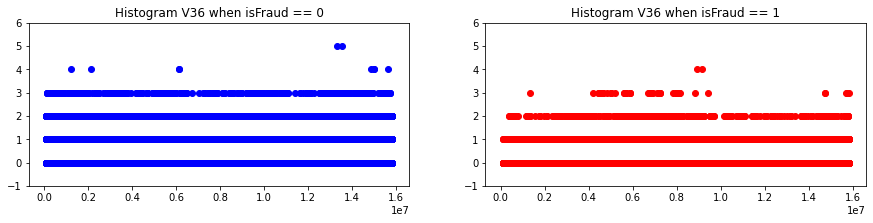

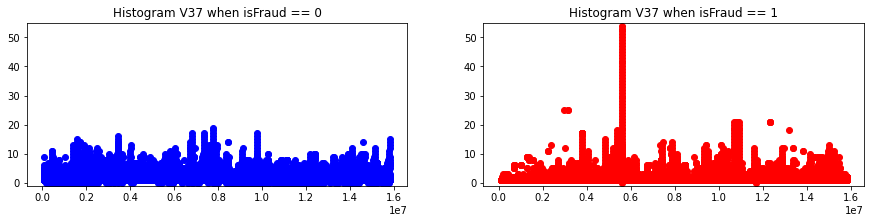

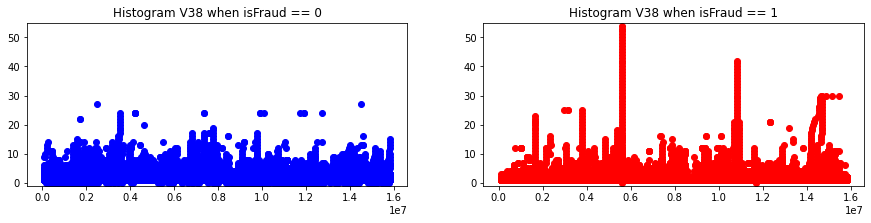

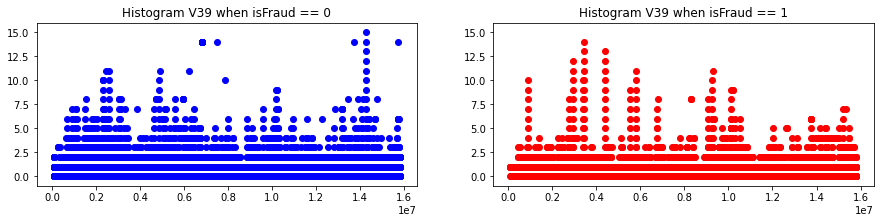

...

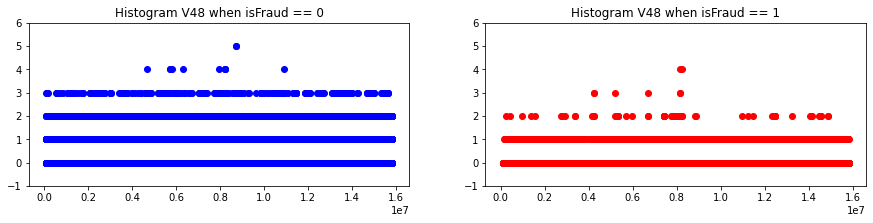

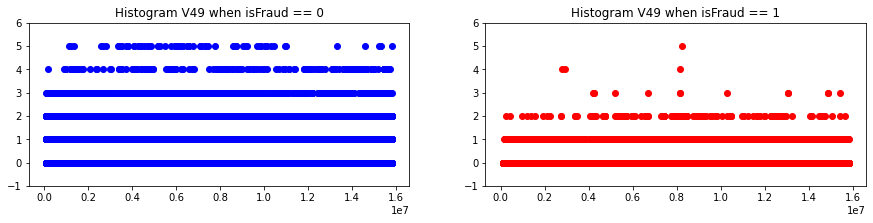

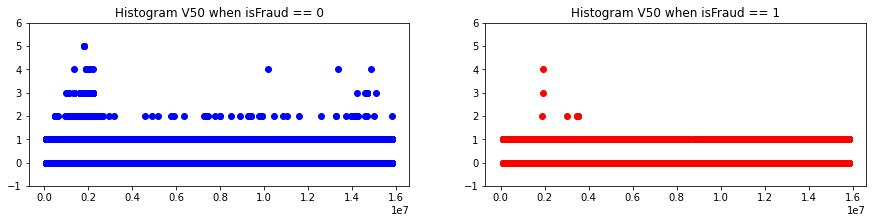

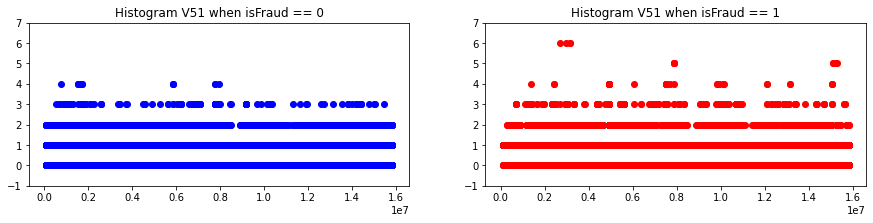

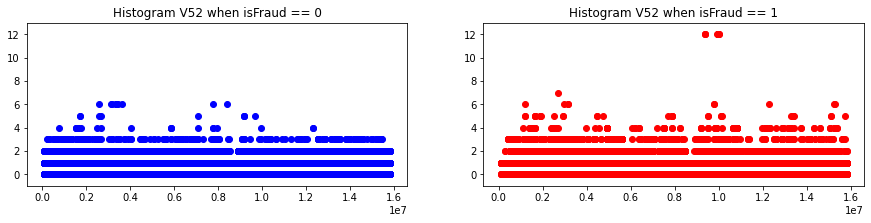

In [33]:
##### Time series graph based on TransactionDT.

group_list = ['V35', 'V36', 'V37', 'V38', 'V39', 'V40', 'V41', 'V42', 'V43', 'V44', 'V45', 'V46', 'V47', 'V48', 'V49', 'V50', 'V51', 'V52']

for column in group_list:
    scatter(column)

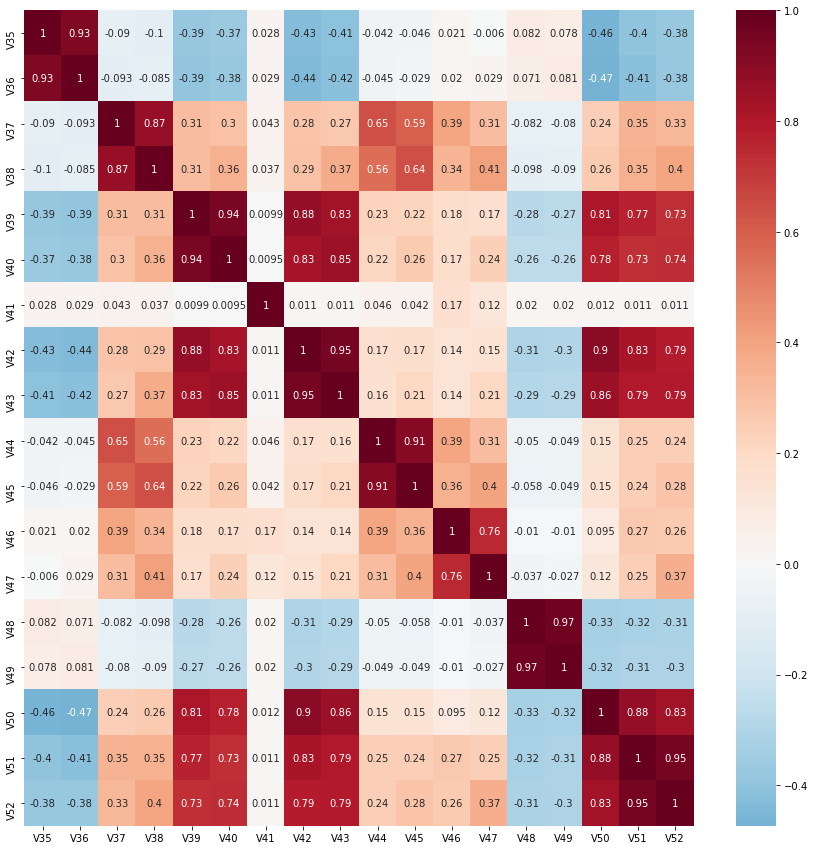

In [34]:
##### Heatmap

plt.figure(figsize = (15,15))
sns.heatmap(train[group_list].corr(), cmap='RdBu_r', annot=True, center=0.0)
plt.show()

In [35]:
##### Ranking of pearson correlation.

for column in group_list:
    corr(group_list,column)
    print(' ')

Correlation with V35
V36    0.931576
V50    0.463197
V42    0.428738
V43    0.409928
V51    0.400202
V39    0.386394
V52    0.377391
V40    0.368280
V38    0.100210
V37    0.090126
V48    0.081729
V49    0.078069
V45    0.045702
V44    0.042316
V41    0.028433
V46    0.020965
V47    0.006029
dtype: float64
 
Correlation with V36
V35    0.931576
V50    0.473321
V42    0.438108
V43    0.418888
V51    0.410290
V39    0.394839
V52    0.378952
V40    0.376330
V37    0.093499
V38    0.085354
V49    0.081203
V48    0.070585
V44    0.044911
V45    0.029222
V41    0.029054
V47    0.028651
V46    0.019861
dtype: float64
 
Correlation with V37
V38    0.868884
V44    0.647236
V45    0.593575
V46    0.390613
V51    0.347443
V52    0.333792
V39    0.314467
V47    0.307469
V40    0.295883
V42    0.283508
V43    0.272750
V50    0.243203
V36    0.093499
V35    0.090126
V48    0.081903
V49    0.079891
V41    0.043387
dtype: float64
 
Correlation with V38
V37    0.868884
V45    0.641233
V44    0.557202
V

In [36]:
##### Based on pearson correlation, we grouped together the columns with corr > 0.7

reduce_groups = [['V35','V36'], ['V37','V38'], ['V39','V40','V42','V43','V50','V51','V52'], ['V41'], ['V44','V45'],['V46','V47'],['V48','V49']]

result = reduce(reduce_groups)
final_vcolumns.extend(result)
print('Final V_Group3 columns:',result)

Final V_Group3 columns: ['V36', 'V38', 'V52', 'V41', 'V45', 'V47', 'V49']


### Group 4

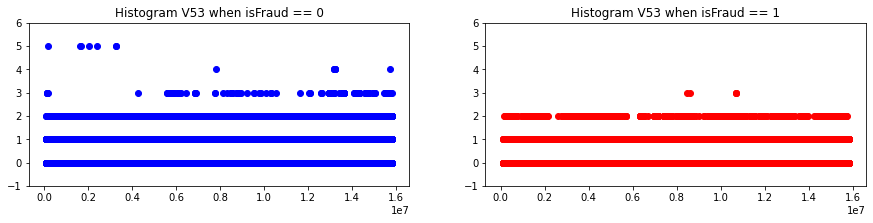

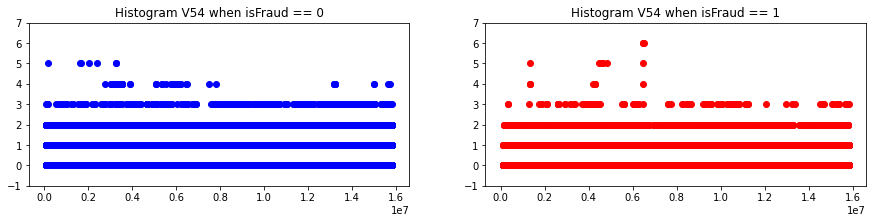

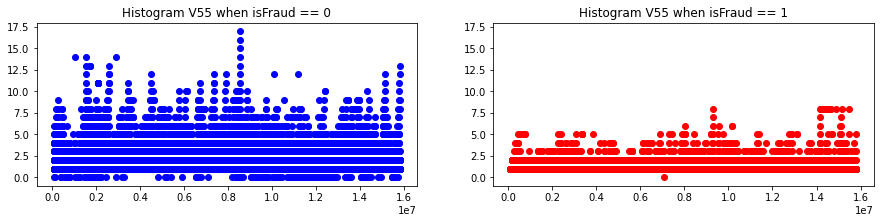

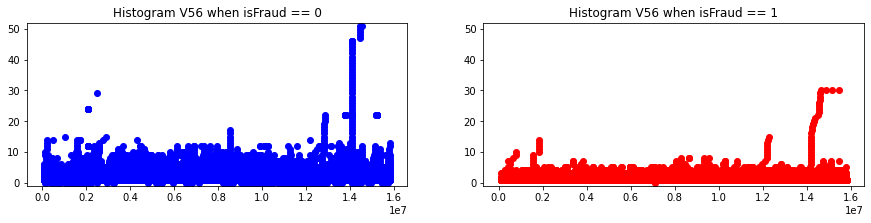

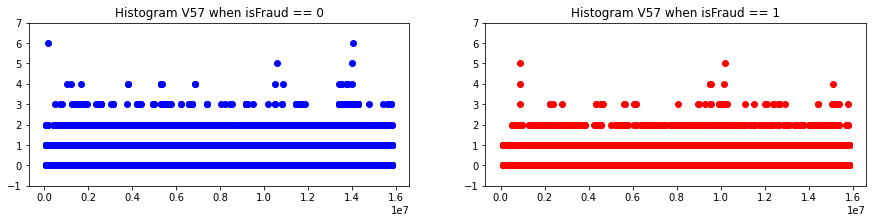

...

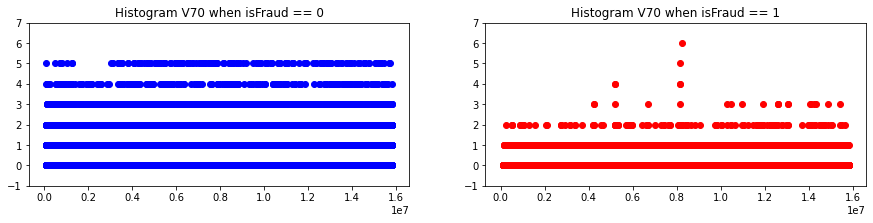

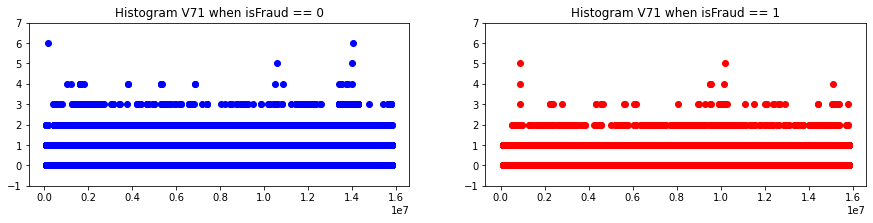

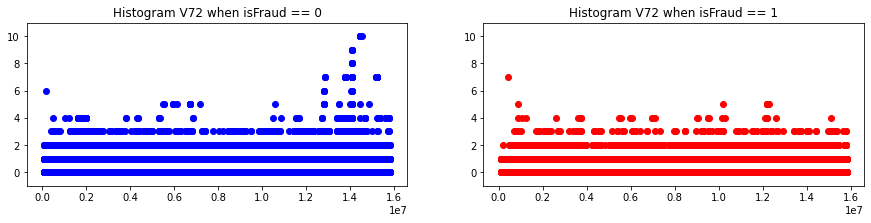

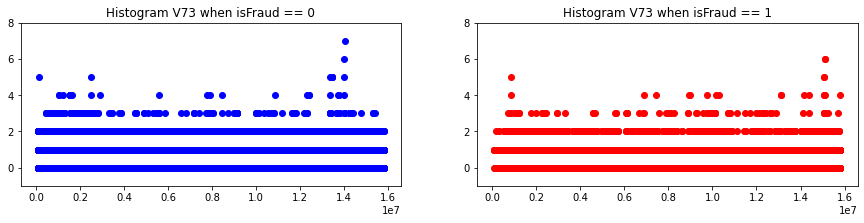

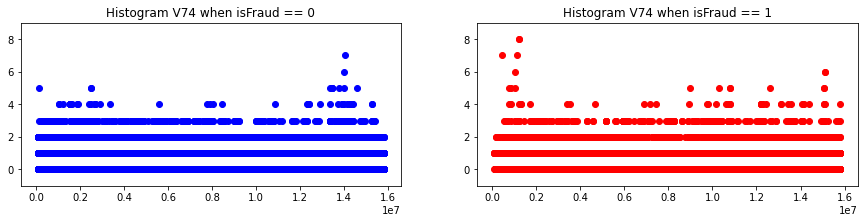

In [37]:
##### Time series graph based on TransactionDT.

group_list = ['V53', 'V54', 'V55', 'V56', 'V57', 'V58', 'V59', 'V60', 'V61', 'V62', 'V63', 'V64', 'V65', 'V66', 'V67', 'V68', 
              'V69', 'V70', 'V71', 'V72', 'V73', 'V74']

for column in group_list:
    scatter(column)

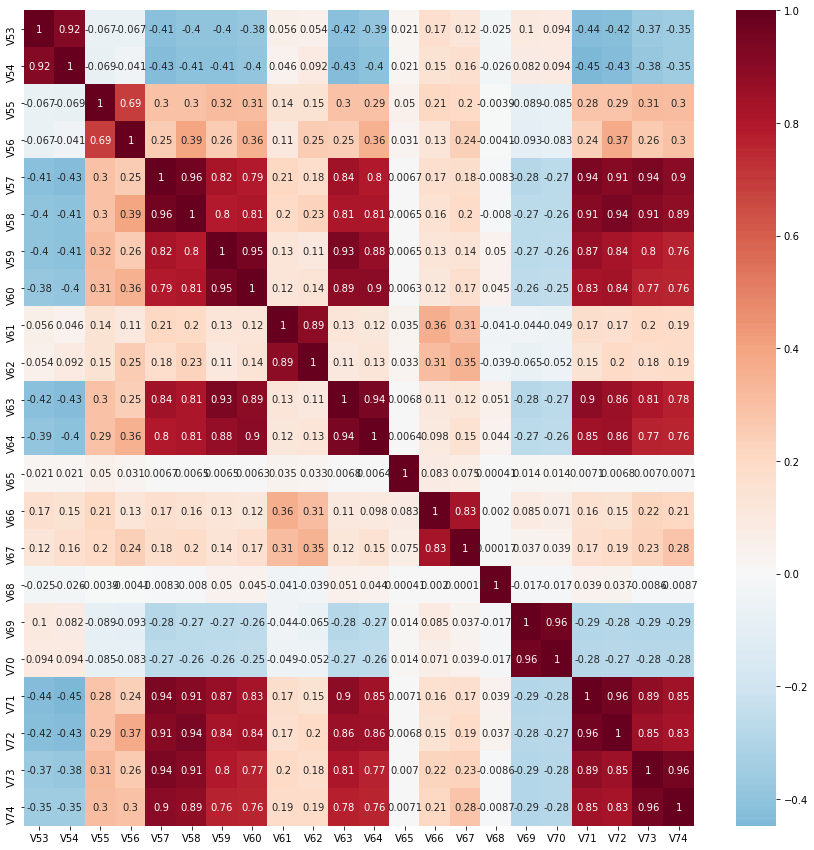

In [38]:
##### Heatmap

plt.figure(figsize = (15,15))
sns.heatmap(train[group_list].corr(), cmap='RdBu_r', annot=True, center=0.0)
plt.show()

In [39]:
##### Ranking of pearson correlation.

for column in group_list:
    corr(group_list,column)
    print(' ')

Correlation with V53
V54    0.920436
V71    0.435866
V72    0.420983
V63    0.415508
V57    0.414989
V58    0.401025
V59    0.400171
V64    0.394248
V60    0.384792
V73    0.373375
V74    0.354115
V66    0.166882
V67    0.124015
V69    0.100423
V70    0.094008
V56    0.067435
V55    0.067213
V61    0.056318
V62    0.054473
V68    0.025359
V65    0.020728
dtype: float64
 
Correlation with V54
V53    0.920436
V71    0.447676
V72    0.432390
V63    0.426767
V57    0.426233
V58    0.411891
V59    0.411014
V64    0.404930
V60    0.395218
V73    0.383893
V74    0.352602
V67    0.164558
V66    0.150464
V70    0.094140
V62    0.092090
V69    0.081739
V55    0.068912
V61    0.046164
V56    0.040906
V68    0.026046
V65    0.021290
dtype: float64
 
Correlation with V55
V56    0.691925
V59    0.316458
V73    0.312927
V60    0.307561
V74    0.304719
V58    0.297251
V57    0.296741
V63    0.296317
V64    0.287857
V72    0.285332
V71    0.284745
V66    0.206482
V67    0.201547
V62    0.145001
V61    

In [40]:
##### Based on pearson correlation, we grouped together the columns with corr > 0.7

reduce_groups = [['V53','V54'], ['V55','V56'], ['V57','V58','V71','V73','V72','V74','V63','V59','V64','V60'],['V61','V62'],['V65'],
                ['V66','V67'],['V68'], ['V69','V70']]

result = reduce(reduce_groups)
final_vcolumns.extend(result)
print('Final V_Group4 columns:',result)

Final V_Group4 columns: ['V54', 'V56', 'V60', 'V62', 'V65', 'V67', 'V68', 'V70']


### Group 5

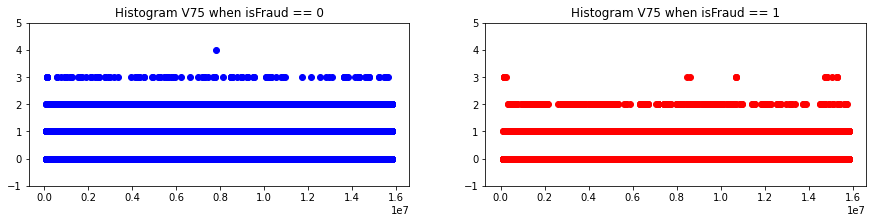

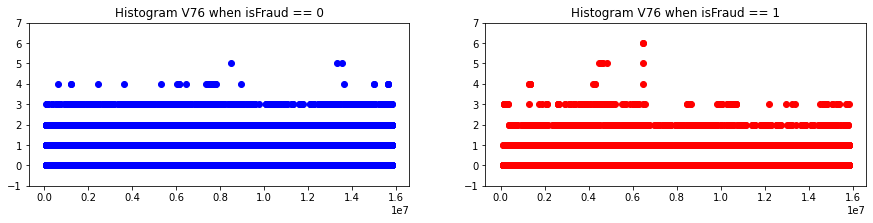

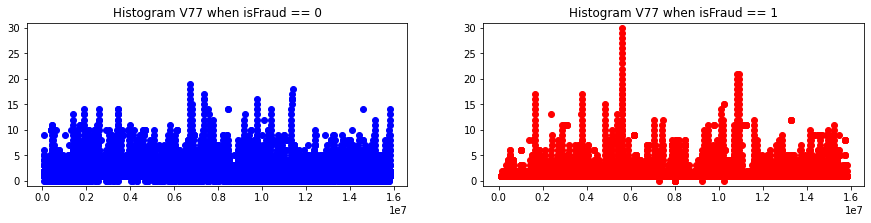

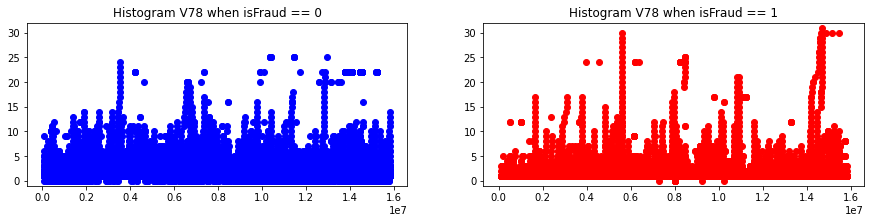

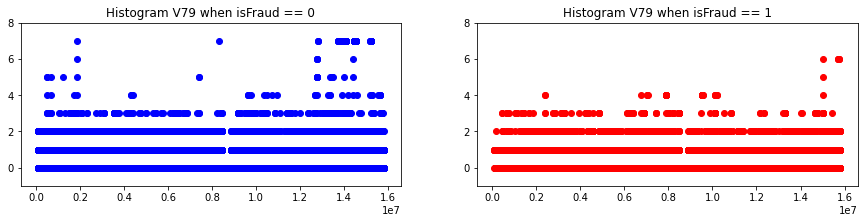

...

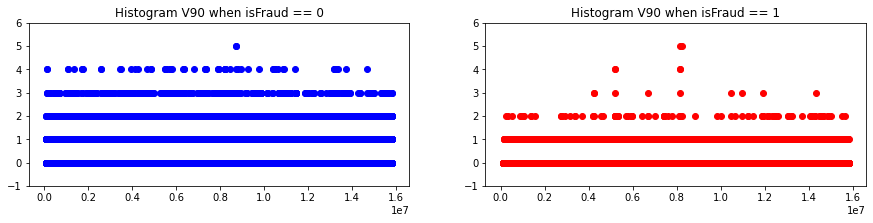

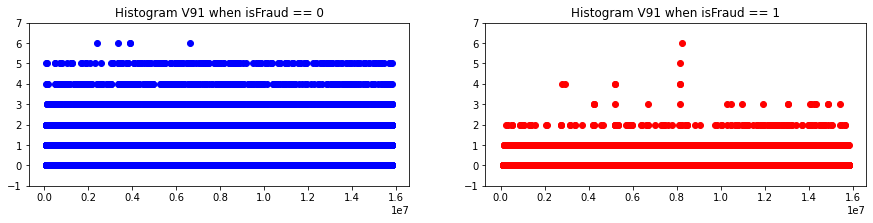

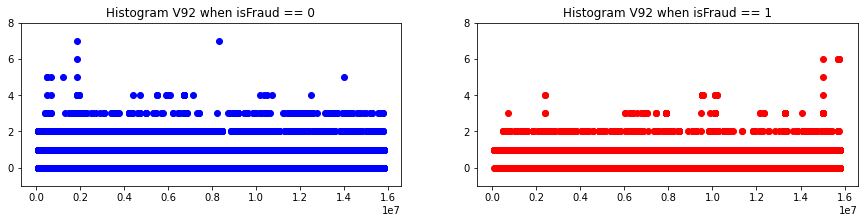

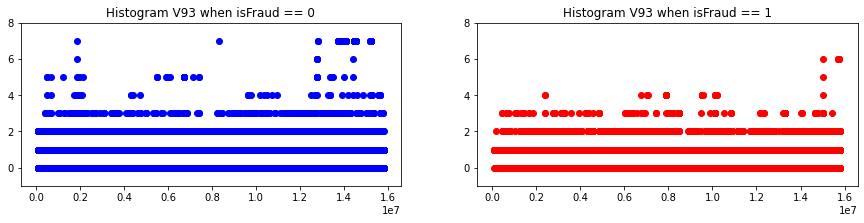

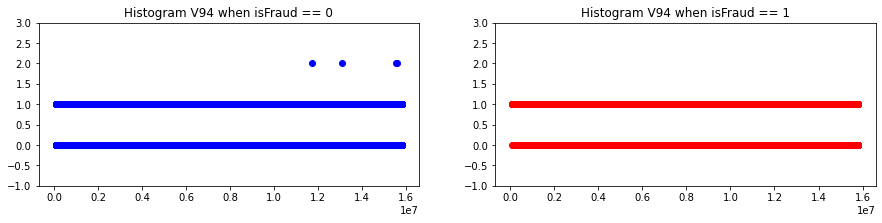

In [41]:
##### Time series graph based on TransactionDT.

group_list = ['V75', 'V76', 'V77', 'V78', 'V79', 'V80', 'V81', 'V82', 'V83', 'V84', 'V85', 'V86', 'V87', 'V88', 'V89', 'V90', 'V91', 'V92', 'V93', 'V94']

for column in group_list:
    scatter(column)

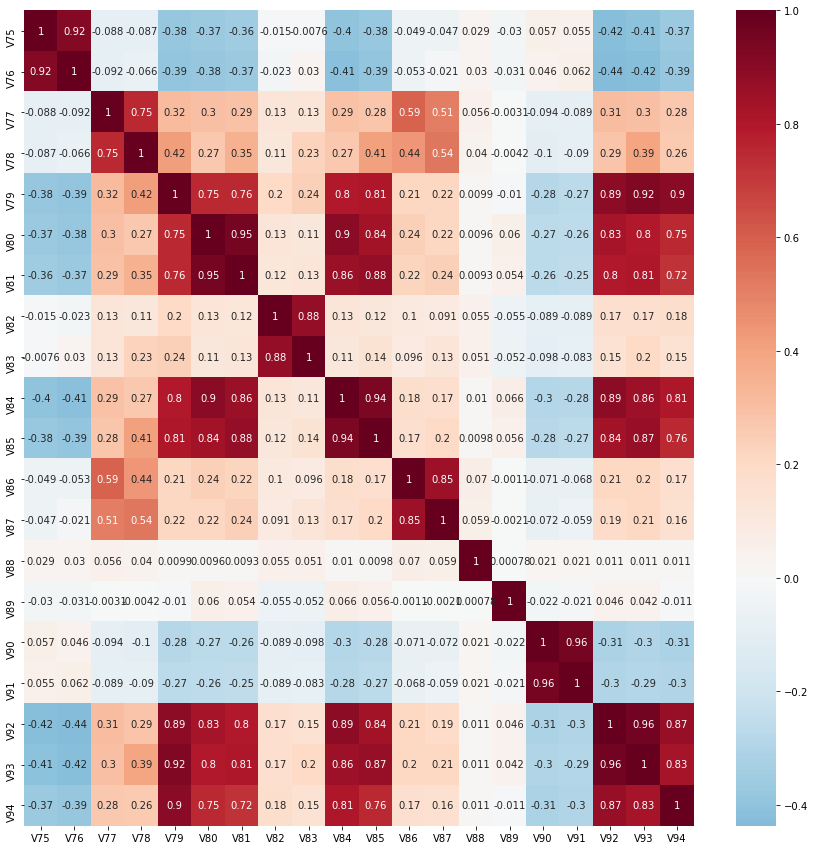

In [42]:
##### Heatmap

plt.figure(figsize = (15,15))
sns.heatmap(train[group_list].corr(), cmap='RdBu_r', annot=True, center=0.0)
plt.show()

In [43]:
##### Ranking of pearson correlation.

for column in group_list:
    corr(group_list,column)
    print(' ')

Correlation with V75
V76    0.918449
V92    0.423442
V93    0.407221
V84    0.401061
V79    0.381256
V85    0.377913
V94    0.372007
V80    0.371622
V81    0.357267
V77    0.087949
V78    0.087180
V90    0.057121
V91    0.055011
V86    0.048557
V87    0.046506
V89    0.029867
V88    0.029068
V82    0.015491
V83    0.007567
dtype: float64
 
Correlation with V76
V75    0.918449
V92    0.436803
V93    0.420071
V84    0.413716
V79    0.393286
V85    0.389838
V94    0.385447
V80    0.383349
V81    0.368541
V77    0.091993
V78    0.066196
V91    0.061592
V86    0.052966
V90    0.045831
V89    0.030809
V83    0.030209
V88    0.029985
V82    0.022671
V87    0.020870
dtype: float64
 
Correlation with V77
V78    0.752716
V86    0.589516
V87    0.510943
V79    0.320793
V92    0.308647
V80    0.303560
V93    0.298964
V84    0.294488
V81    0.289466
V85    0.276563
V94    0.275097
V82    0.133774
V83    0.125480
V90    0.094086
V76    0.091993
V91    0.089484
V75    0.087949
V88    0.056017
V89    

In [44]:
##### Based on pearson correlation, we grouped together the columns with corr > 0.7

reduce_groups = [['V75','V76'],['V77','V78'], ['V79', 'V94', 'V93', 'V92', 'V84', 'V85', 'V80', 'V81'],['V82','V83'],['V86','V87'],['V88'],['V89'],['V90','V91']]

result = reduce(reduce_groups)
final_vcolumns.extend(result)
print('Final V_Group5 columns:',result)

Final V_Group5 columns: ['V76', 'V78', 'V81', 'V83', 'V87', 'V88', 'V89', 'V91']


### Group 6

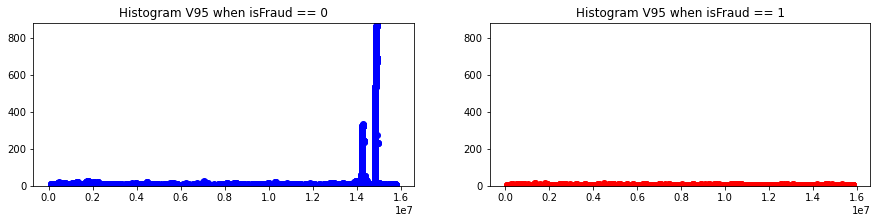

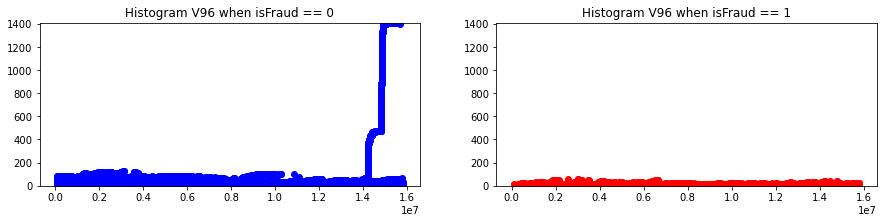

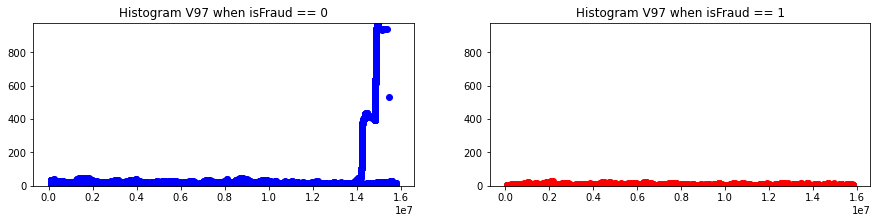

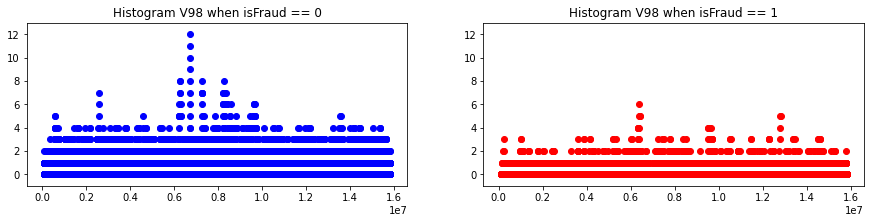

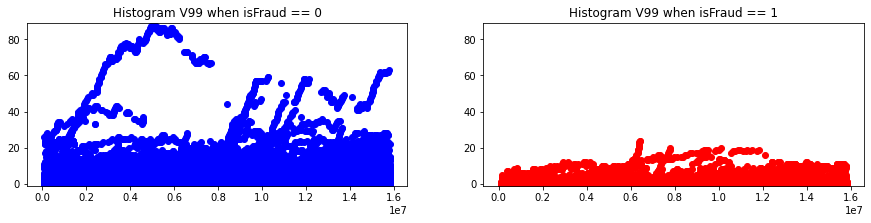

...

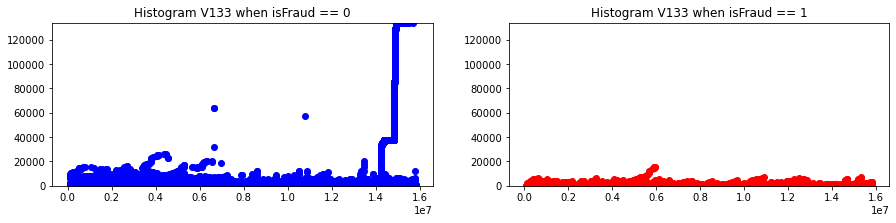

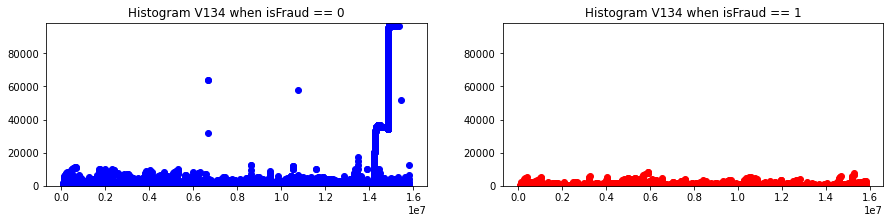

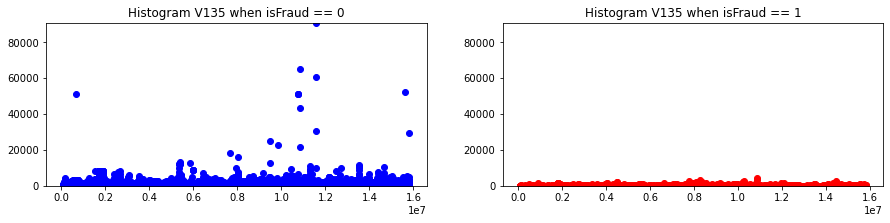

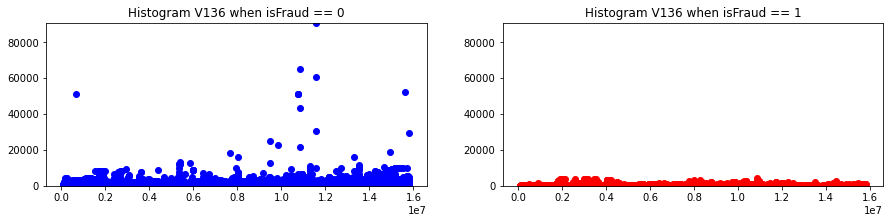

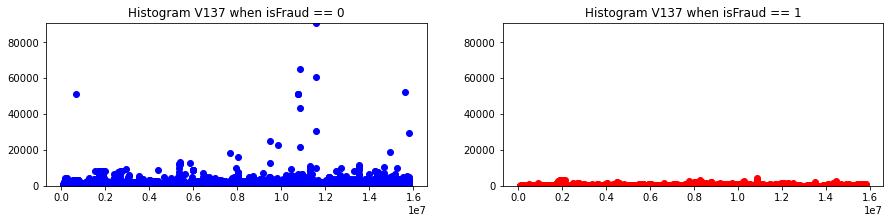

In [45]:
##### Time series graph based on TransactionDT.

group_list = ['V95', 'V96', 'V97', 'V98', 'V99', 'V100', 'V101', 'V102', 'V103', 'V104', 'V105', 'V106', 'V107', 'V108', 'V109', 'V110', 'V111', 'V112', 
              'V113', 'V114', 'V115', 'V116', 'V117', 'V118', 'V119', 'V120', 'V121', 'V122', 'V123', 'V124', 'V125', 'V126', 'V127', 'V128', 'V129', 'V130',
              'V131', 'V132', 'V133', 'V134', 'V135', 'V136', 'V137']

for column in group_list:
    scatter(column)

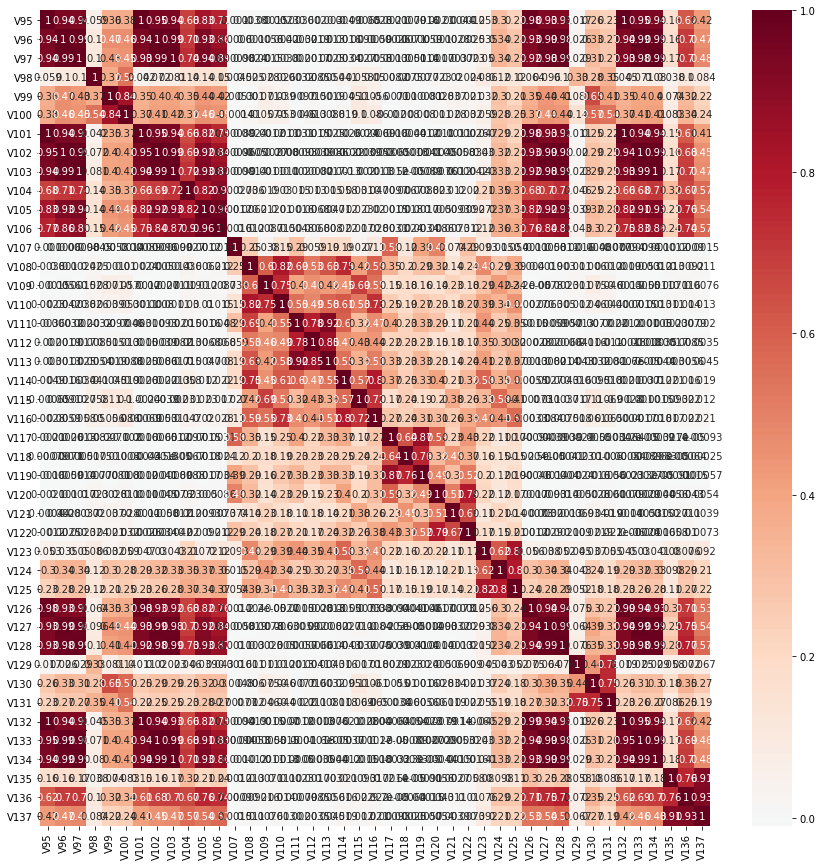

In [46]:
##### Heatmap

plt.figure(figsize = (15,15))
sns.heatmap(train[group_list].corr(), cmap='RdBu_r', annot=True, center=0.0)
plt.show()

In [47]:
##### Ranking of pearson correlation.

for column in group_list:
    corr(group_list,column)
    print(' ')

Correlation with V95
V101    0.999594
V132    0.995258
V126    0.981997
V102    0.948684
V133    0.946187
V96     0.941443
V103    0.941031
V134    0.941030
V97     0.936049
V127    0.933317
V128    0.927770
V105    0.833377
V106    0.767663
V104    0.683027
V136    0.623133
V137    0.420330
V100    0.376282
V99     0.362372
V124    0.298188
V130    0.260829
V125    0.234315
V131    0.228978
V135    0.161155
V98     0.059287
V123    0.053276
V129    0.016988
V114    0.004920
V108    0.003847
V111    0.003559
V113    0.003045
V116    0.002831
V110    0.002304
V120    0.002082
V117    0.002074
V112    0.001984
V119    0.001648
V122    0.001225
V107    0.001012
V118    0.000791
V115    0.000653
V121    0.000437
V109    0.000153
dtype: float64
 
Correlation with V96
V102    0.997104
V133    0.992326
V97     0.990797
V103    0.990676
V134    0.988273
V127    0.987874
V128    0.979007
V95     0.941443
V101    0.938408
V132    0.936595
V105    0.933182
V126    0.926245
V106    0.855489
V104  

In [48]:
##### Based on pearson correlation, we grouped together the columns with corr > 0.7
# We omit V107 since there is no info about corr with other columns and its unique values are 1.

reduce_groups = [['V95','V101'],['V96','V102','V97','V99','V100','V103'],['V98'],['V104','V106','V105'],['V108','V110','V114','V109','V111','V113','V112','V115','V116'],
                ['V117','V119','V118'],['V120','V122','V121'],['V123','V125','V124'],['V126','V128','V132'],['V127','V133','V134'],['V129','V131','V130'],
                ['V135','V137','V136']]

result = reduce(reduce_groups)
final_vcolumns.extend(result)
print('Final V_Group6 columns:',result)

Final V_Group6 columns: ['V101', 'V103', 'V98', 'V105', 'V116', 'V118', 'V121', 'V124', 'V132', 'V134', 'V130', 'V136']


### Group 7

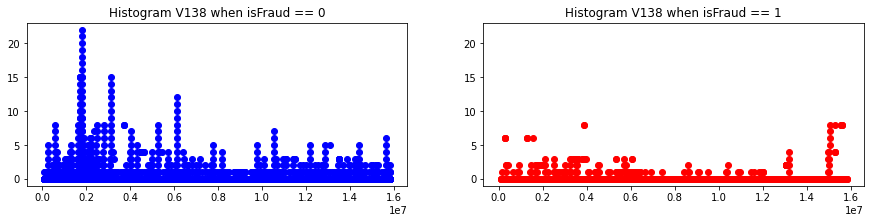

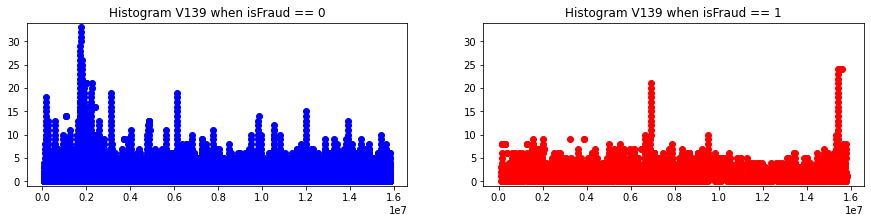

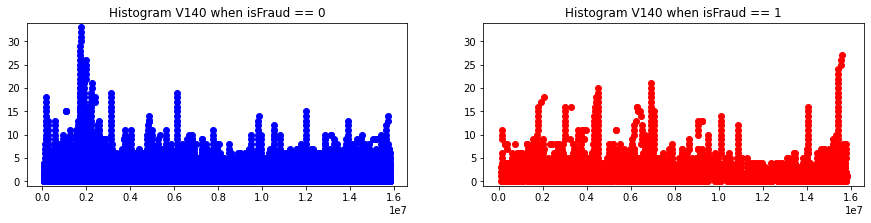

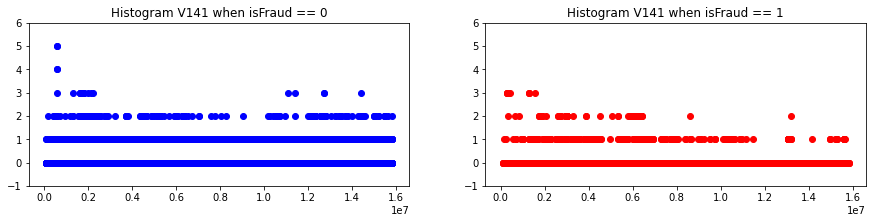

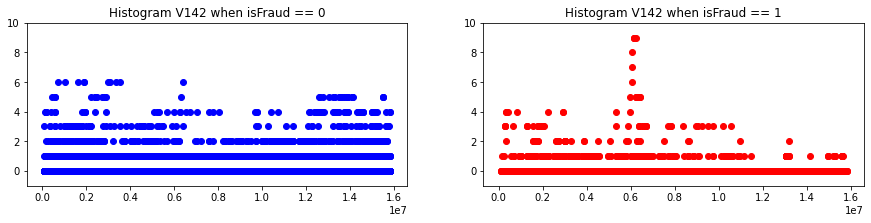

...

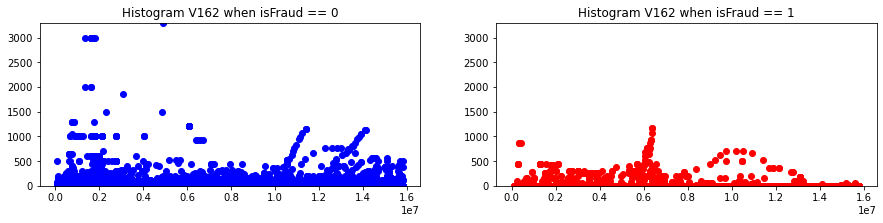

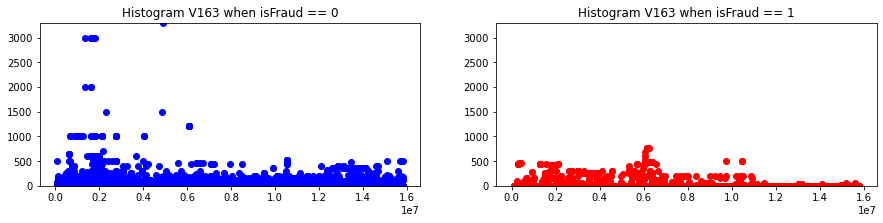

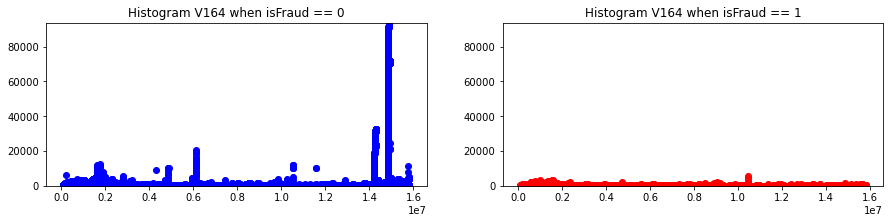

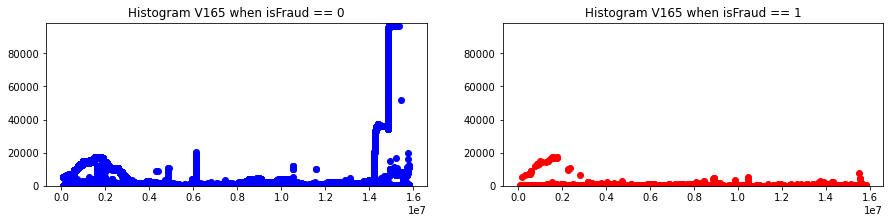

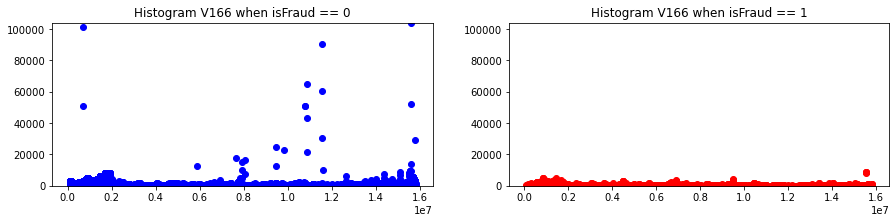

In [49]:
##### Time series graph based on TransactionDT.

group_list = ['V138', 'V139', 'V140', 'V141', 'V142', 'V143', 'V144', 'V145', 'V146', 'V147', 'V148', 'V149', 'V150', 'V151', 'V152', 'V153', 'V154', 
              'V155', 'V156', 'V157', 'V158', 'V159', 'V160', 'V161', 'V162', 'V163', 'V164', 'V165', 'V166']

for column in group_list:
    scatter(column)

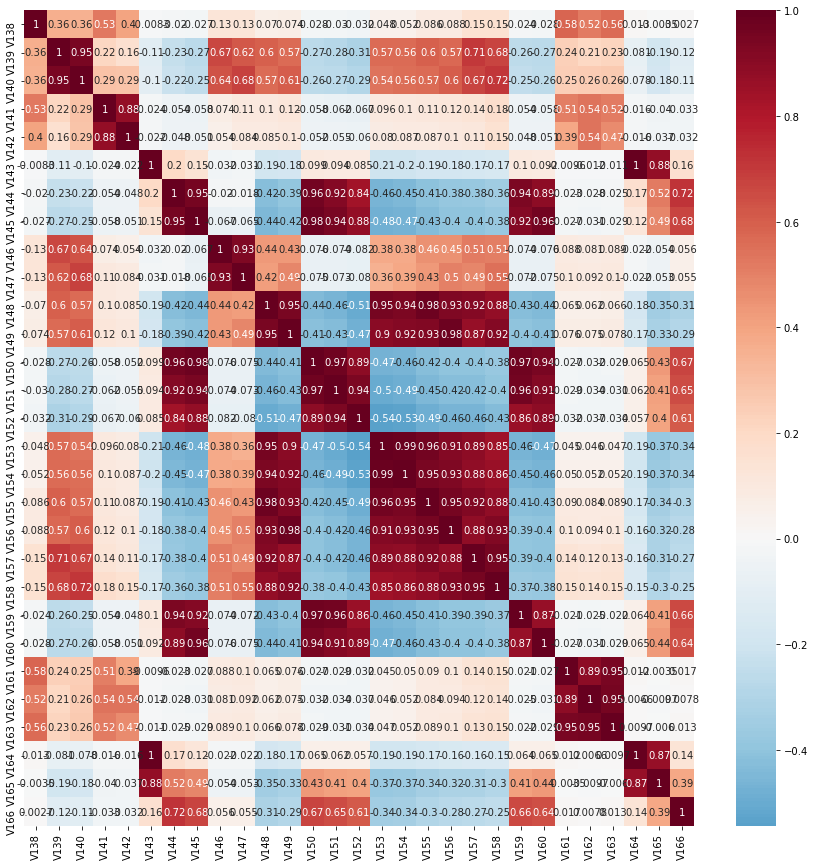

In [50]:
##### Heatmap

plt.figure(figsize = (15,15))
sns.heatmap(train[group_list].corr(), cmap='RdBu_r', annot=True, center=0.0)
plt.show()

In [51]:
##### Ranking of pearson correlation.

for column in group_list:
    corr(group_list,column)
    print(' ')

Correlation with V138
V161    0.579542
V163    0.560321
V141    0.526152
V162    0.518303
V142    0.397407
V139    0.361921
V140    0.355494
V158    0.151383
V157    0.150237
V147    0.130678
V146    0.126946
V156    0.088424
V155    0.085845
V149    0.074213
V148    0.070179
V154    0.051988
V153    0.047959
V152    0.032441
V151    0.030001
V150    0.028277
V160    0.028126
V145    0.027143
V159    0.023795
V144    0.020355
V164    0.013079
V143    0.008314
V165    0.003520
V166    0.002748
dtype: float64
 
Correlation with V139
V140    0.945770
V157    0.706701
V158    0.678448
V146    0.666175
V147    0.620991
V155    0.598145
V148    0.596901
V156    0.572140
V149    0.569643
V153    0.567478
V154    0.561021
V138    0.361921
V152    0.309434
V151    0.282841
V160    0.268757
V150    0.268152
V145    0.267330
V159    0.260153
V161    0.236621
V144    0.234086
V163    0.226074
V141    0.215163
V162    0.208154
V165    0.190733
V142    0.159916
V166    0.120061
V143    0.110031
V164

In [52]:
##### Based on pearson correlation, we grouped together the columns with corr > 0.7

reduce_groups = [['V138'],['V139','V140'],['V141','V142'],['V143','V159','V150','V151','V165','V144','V145','V160','V152','V164','V166'],['V146','V147'],
                ['V148','V155','V149','V153','V154','V156','V157','V158'],['V161','V163','V162']]

result = reduce(reduce_groups)
final_vcolumns.extend(result)
print('Final V_Group7 columns:',result)

Final V_Group7 columns: ['V138', 'V140', 'V142', 'V166', 'V147', 'V158', 'V162']


### Group 8

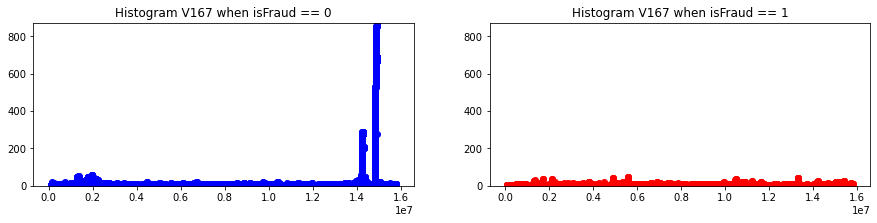

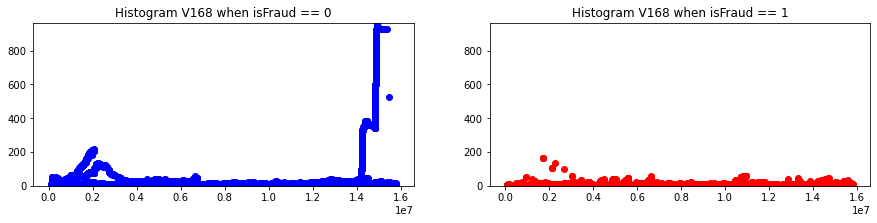

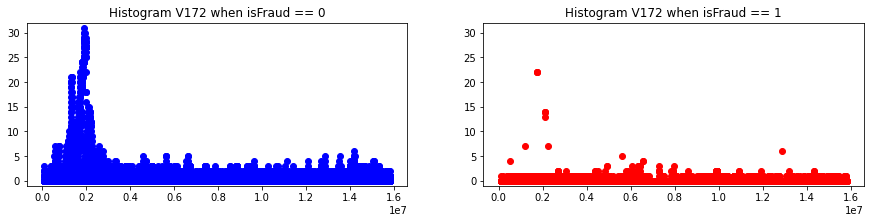

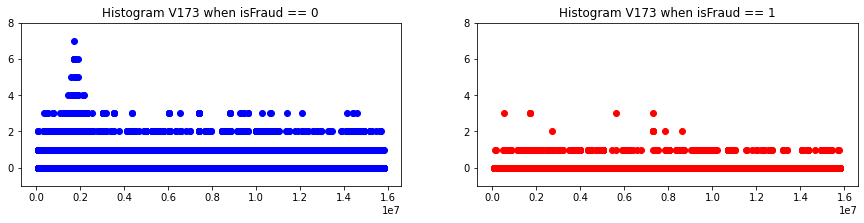

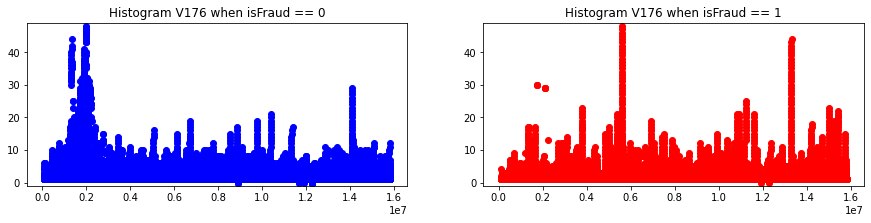

...

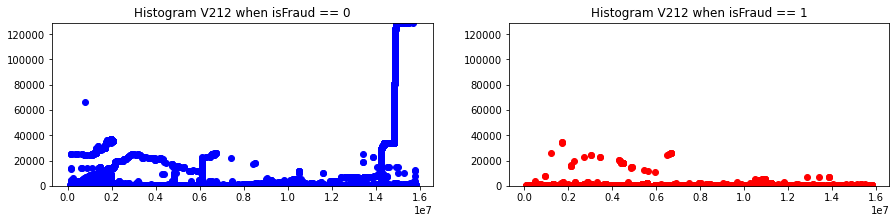

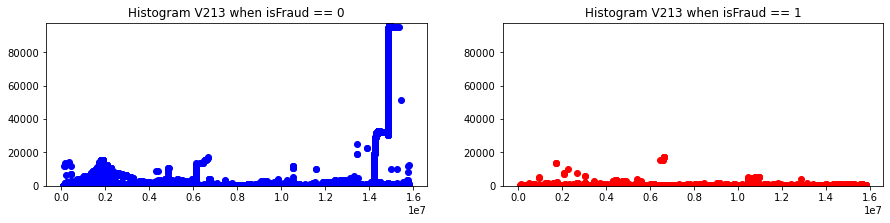

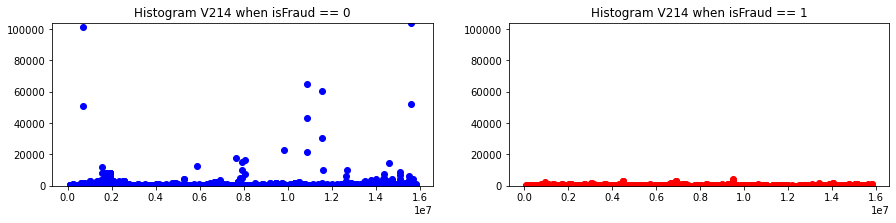

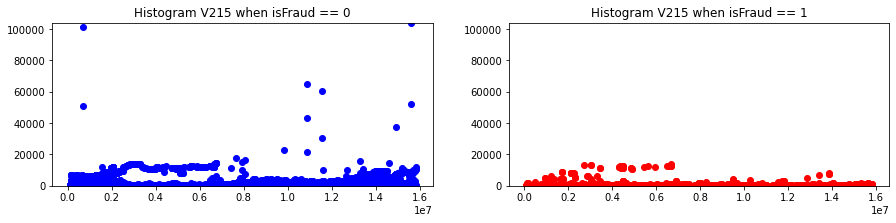

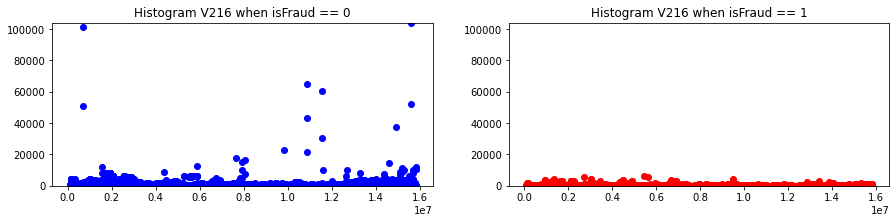

In [53]:
##### Time series graph based on TransactionDT.

group_list = ['V167', 'V168', 'V172', 'V173', 'V176', 'V177', 'V178', 'V179', 'V181', 'V182', 'V183', 'V186', 'V187', 'V190', 'V191', 'V192', 'V193', 
              'V196', 'V199', 'V202', 'V203', 'V204', 'V205', 'V206', 'V207', 'V211', 'V212', 'V213', 'V214', 'V215', 'V216']

for column in group_list:
    scatter(column)

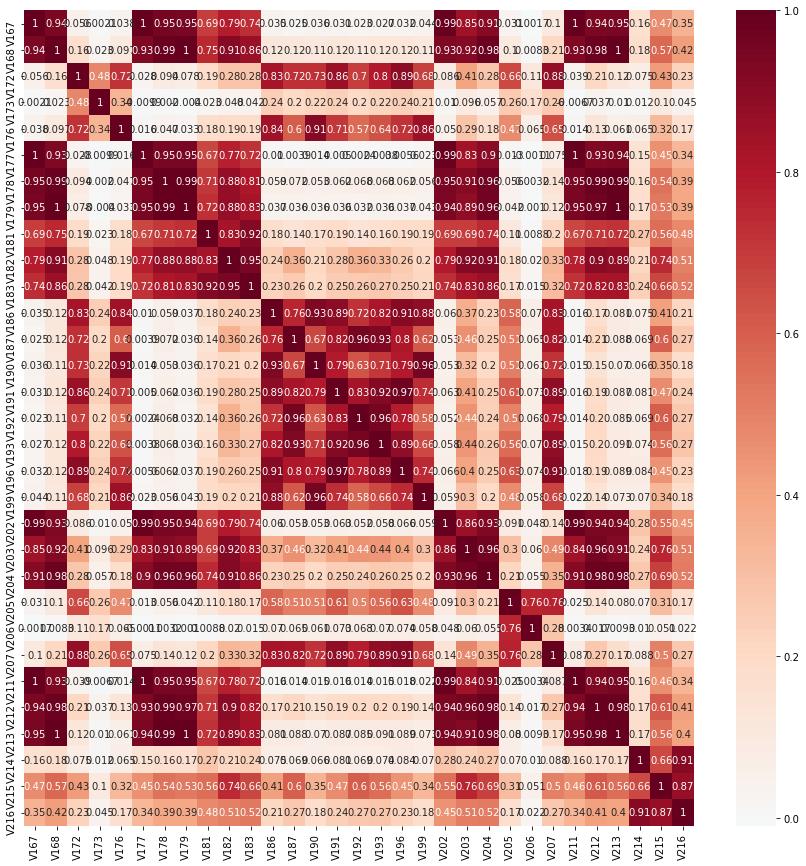

In [54]:
##### Heatmap

plt.figure(figsize = (15,15))
sns.heatmap(train[group_list].corr(), cmap='RdBu_r', annot=True, center=0.0)
plt.show()

In [55]:
##### Ranking of pearson correlation.

for column in group_list:
    corr(group_list,column)
    print(' ')

Correlation with V167
V177    0.999364
V211    0.997784
V202    0.988960
V178    0.953659
V179    0.948751
V213    0.948126
V168    0.940362
V212    0.936981
V204    0.912279
V203    0.846883
V182    0.786254
V183    0.737424
V181    0.690906
V215    0.469220
V216    0.347954
V214    0.160324
V207    0.099713
V172    0.056242
V199    0.044362
V176    0.037976
V190    0.035526
V186    0.034611
V196    0.031879
V205    0.031325
V191    0.030633
V193    0.026921
V187    0.024972
V192    0.022835
V173    0.002131
V206    0.001727
dtype: float64
 
Correlation with V168
V213    0.995785
V179    0.995005
V178    0.989183
V212    0.982553
V204    0.980744
V167    0.940362
V211    0.934721
V177    0.934138
V202    0.933979
V203    0.920584
V182    0.905508
V183    0.860836
V181    0.749888
V215    0.573232
V216    0.418822
V207    0.206965
V214    0.177303
V172    0.163977
V193    0.124522
V196    0.124507
V191    0.122196
V187    0.118902
V186    0.117476
V192    0.111842
V199    0.109061
V190

In [56]:
##### Based on pearson correlation, we grouped together the columns with corr > 0.7

reduce_groups = ['V167','V176','V199','V179','V190','V177','V186','V168','V172','V178','V196','V191','V204','V213','V207','V173'],['V181','V183','V182',
                'V187','V192','V203','V215','V178','V193','V212','V204'],['V202','V216','V204','V214']

result = reduce(reduce_groups)
final_vcolumns.extend(result)
print('Final V_Group8 columns:',result)

Final V_Group8 columns: ['V173', 'V204', 'V214']


### Group 9

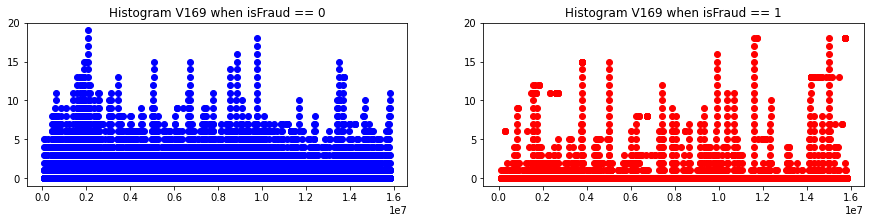

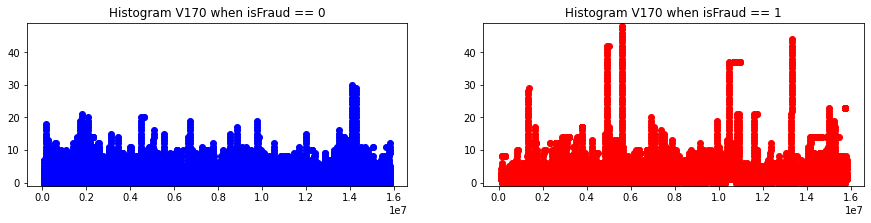

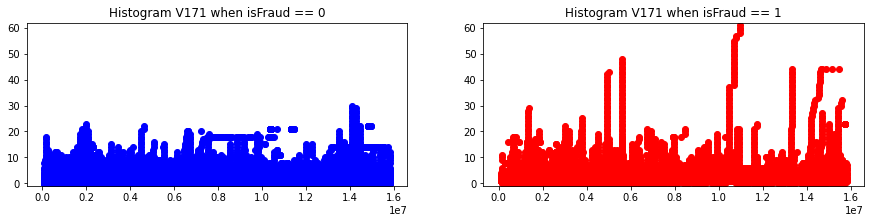

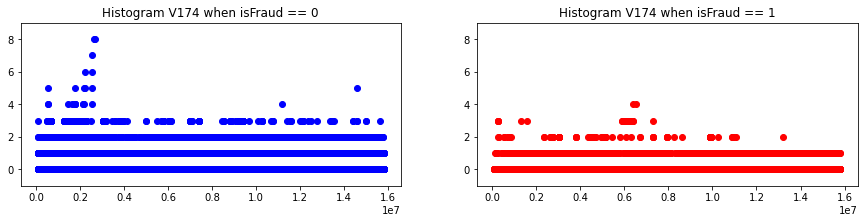

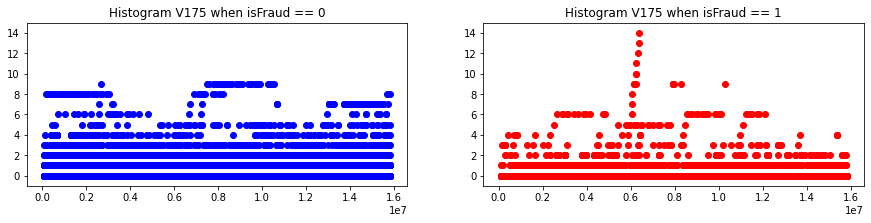

...

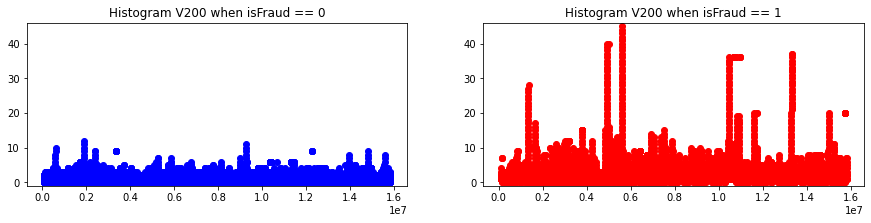

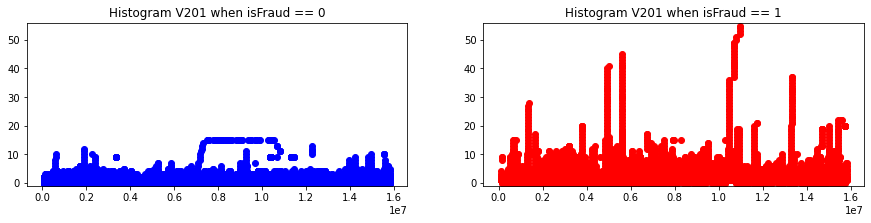

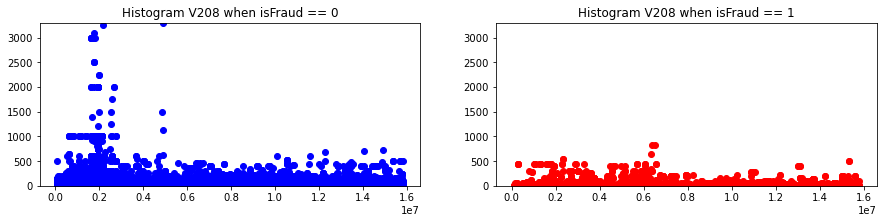

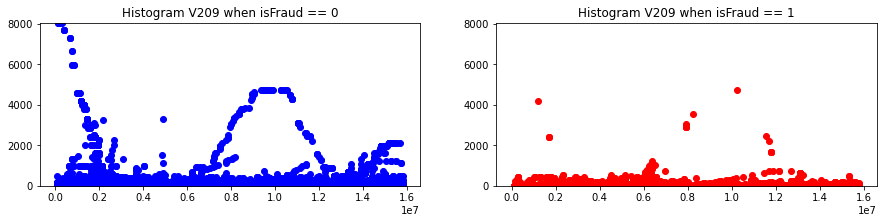

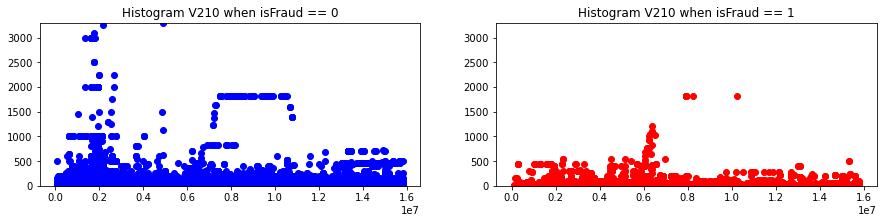

In [57]:
##### Time series graph based on TransactionDT.

group_list = ['V169', 'V170', 'V171', 'V174', 'V175', 'V180', 'V184', 'V185', 'V188', 'V189', 'V194', 'V195', 'V197', 'V198', 'V200', 'V201', 'V208', 'V209', 'V210']

for column in group_list:
    scatter(column)

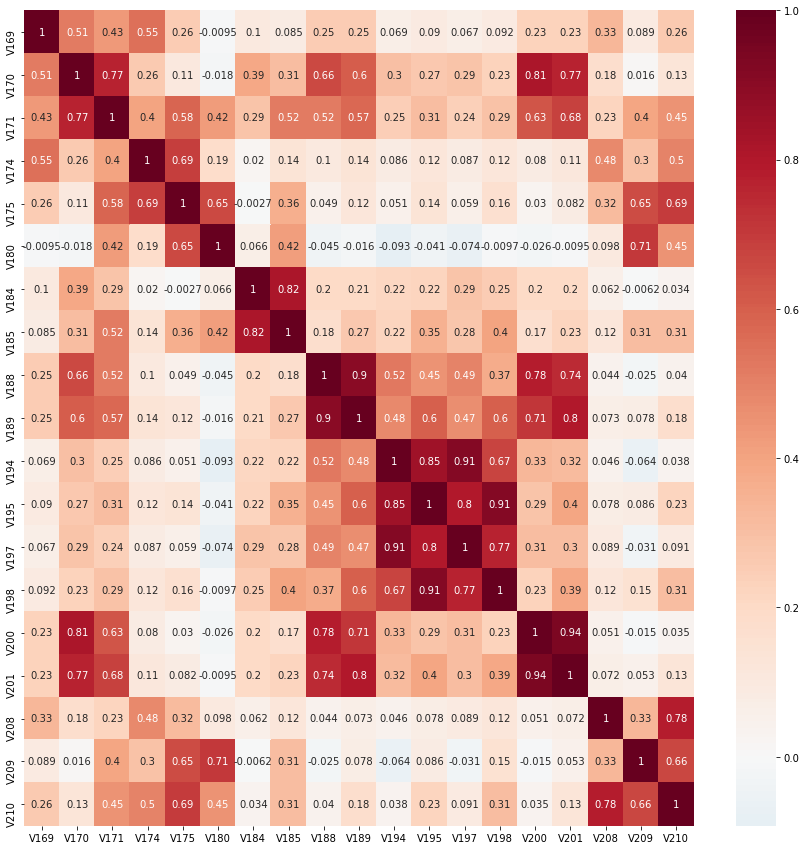

In [58]:
##### Heatmap

plt.figure(figsize = (15,15))
sns.heatmap(train[group_list].corr(), cmap='RdBu_r', annot=True, center=0.0)
plt.show()

In [59]:
##### Ranking of pearson correlation.

for column in group_list:
    corr(group_list,column)
    print(' ')

Correlation with V169
V174    0.550426
V170    0.513739
V171    0.429721
V208    0.331939
V210    0.258666
V175    0.257053
V188    0.251328
V189    0.250614
V201    0.234623
V200    0.229875
V184    0.101040
V198    0.092393
V195    0.090002
V209    0.088978
V185    0.084630
V194    0.068864
V197    0.067435
V180    0.009462
dtype: float64
 
Correlation with V170
V200    0.812939
V201    0.769216
V171    0.767816
V188    0.657415
V189    0.604551
V169    0.513739
V184    0.386047
V185    0.308345
V194    0.299618
V197    0.285622
V195    0.269765
V174    0.264779
V198    0.230691
V208    0.177795
V210    0.127763
V175    0.108415
V180    0.017622
V209    0.015686
dtype: float64
 
Correlation with V171
V170    0.767816
V201    0.681537
V200    0.631625
V175    0.581933
V189    0.569446
V188    0.519517
V185    0.515634
V210    0.446371
V169    0.429721
V180    0.424783
V174    0.404149
V209    0.395533
V195    0.305312
V198    0.293828
V184    0.289445
V194    0.248044
V197    0.241944

In [60]:
##### Based on pearson correlation, we grouped together the columns with corr > 0.7

reduce_groups = [['V169'],['V170','V171','V200','V201'],['V174','V175'],['V180'],['V184','V185'],['V188','V189'],['V194','V197','V195','V198'],
                ['V208','V210','V209']]

result = reduce(reduce_groups)
final_vcolumns.extend(result)
print('Final V_Group9 columns:',result)

Final V_Group9 columns: ['V169', 'V201', 'V175', 'V180', 'V185', 'V189', 'V198', 'V209']


### Group 10

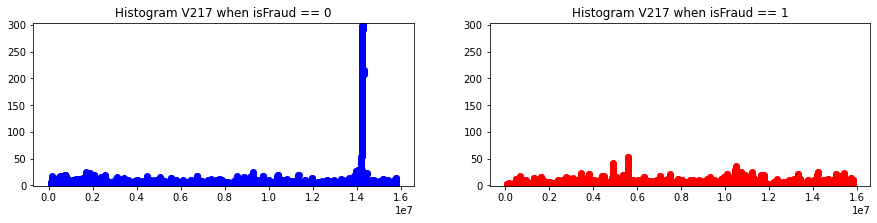

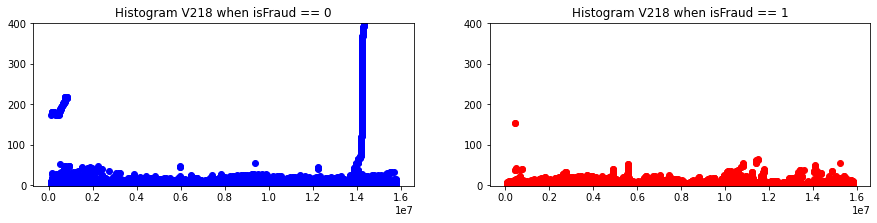

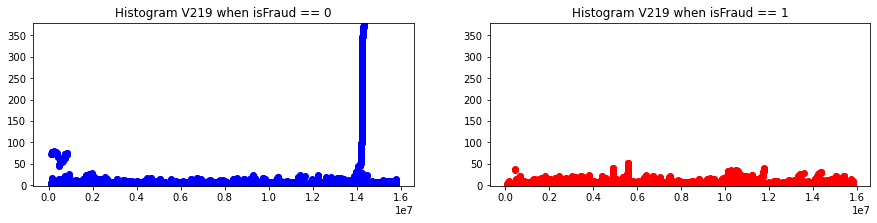

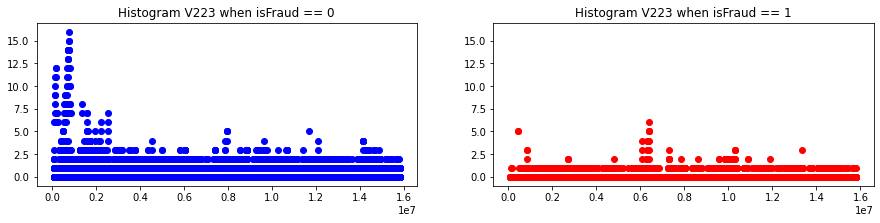

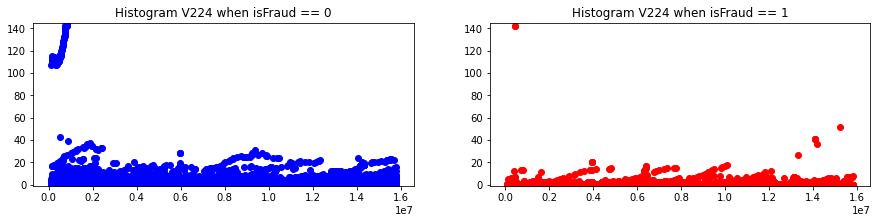

...

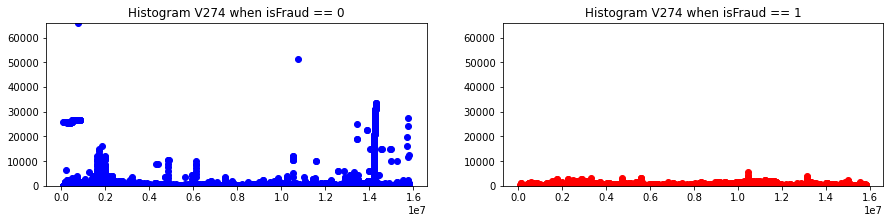

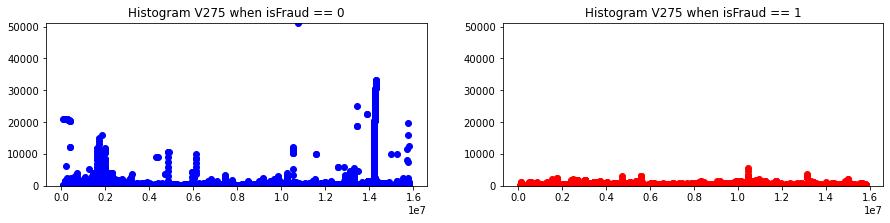

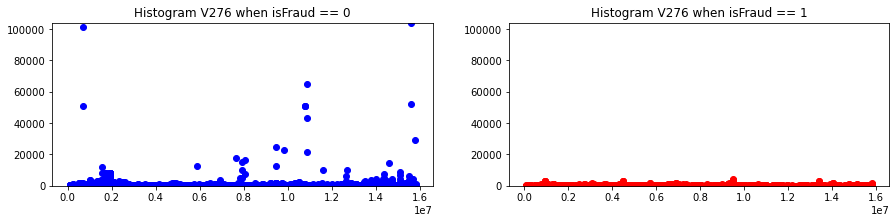

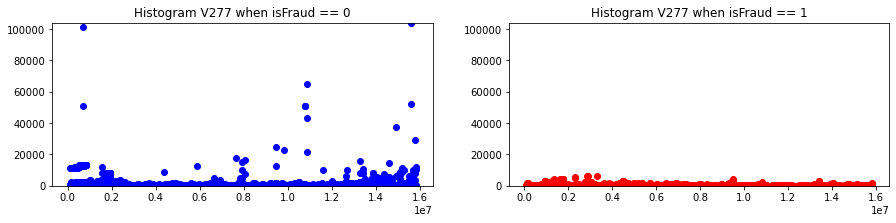

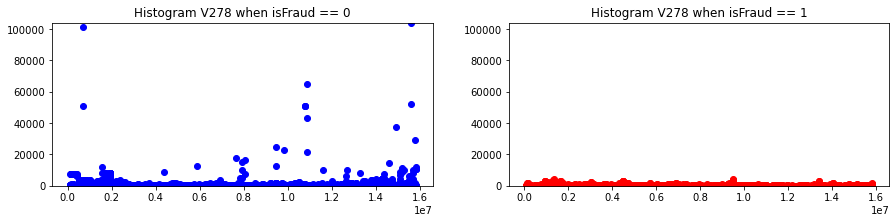

In [61]:
##### Time series graph based on TransactionDT.

group_list = ['V217', 'V218', 'V219', 'V223', 'V224', 'V225', 'V226', 'V228', 'V229', 'V230', 'V231', 'V232', 'V233', 'V235', 'V236', 'V237','V240',
              'V241', 'V242', 'V243', 'V244', 'V246', 'V247', 'V248', 'V249', 'V252', 'V253', 'V254', 'V257', 'V258', 'V260', 'V261', 'V262', 'V263',
              'V264', 'V265', 'V266', 'V267', 'V268', 'V269', 'V273', 'V274', 'V275', 'V276', 'V277', 'V278']

for column in group_list:
    scatter(column)

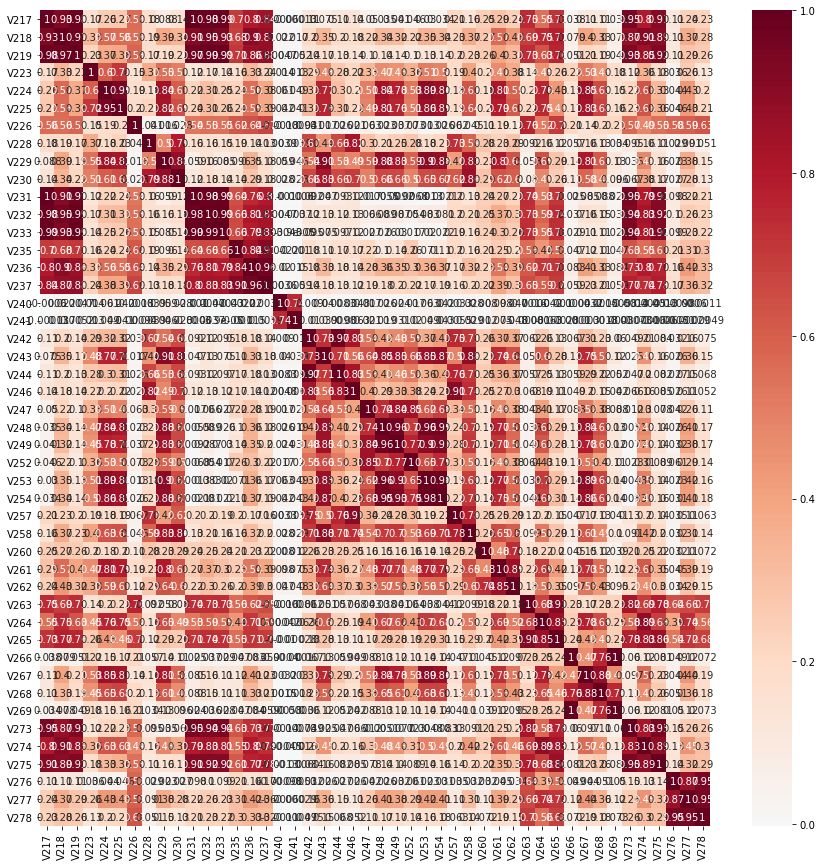

In [62]:
##### Heatmap

plt.figure(figsize = (15,15))
sns.heatmap(train[group_list].corr(), cmap='RdBu_r', annot=True, center=0.0)
plt.show()

In [63]:
##### Ranking of pearson correlation.

for column in group_list:
    corr(group_list,column)
    print(' ')

Correlation with V217
V231    0.995970
V233    0.989669
V232    0.983680
V219    0.983101
V273    0.950550
V218    0.926164
V275    0.910011
V237    0.838526
V274    0.801876
V236    0.796788
V263    0.746569
V265    0.725601
V235    0.700835
V226    0.563872
V264    0.551757
V261    0.292818
V225    0.272882
V224    0.255991
V260    0.249027
V262    0.241678
V277    0.240129
V278    0.231838
V257    0.209876
V228    0.183855
V223    0.173945
V258    0.156434
V230    0.144044
V246    0.138230
V242    0.114858
V244    0.114636
V267    0.112952
V276    0.112478
V268    0.111658
V229    0.088176
V243    0.074757
V247    0.050391
V252    0.046455
V249    0.041056
V266    0.037560
V248    0.034903
V269    0.034401
V254    0.033564
V253    0.029534
V240    0.000602
V241    0.000131
dtype: float64
 
Correlation with V218
V219    0.969563
V232    0.953062
V233    0.930716
V217    0.926164
V231    0.911393
V274    0.911002
V236    0.904253
V275    0.891473
V237    0.871584
V273    0.870418
V265

In [64]:
##### Based on pearson correlation, we grouped together the columns with corr > 0.7

reduce_groups = [['V217','V231','V233','V228','V257','V219','V232','V246'],['V218','V229','V224','V225','V253','V243','V254','V248','V264','V261','V249','V258',
                'V267','V274','V230','V236','V247','V262','V223','V252','V260'],['V226','V263','V276','V278'], ['V235','V237'],['V240','V241'],['V242','V244'],
                ['V265','V275','V277','V268','V273'],['V269','V266']]

result = reduce(reduce_groups)
final_vcolumns.extend(result)
print('Final V_Group10 columns:',result)

Final V_Group10 columns: ['V246', 'V260', 'V278', 'V237', 'V241', 'V244', 'V273', 'V266']


### Group 11

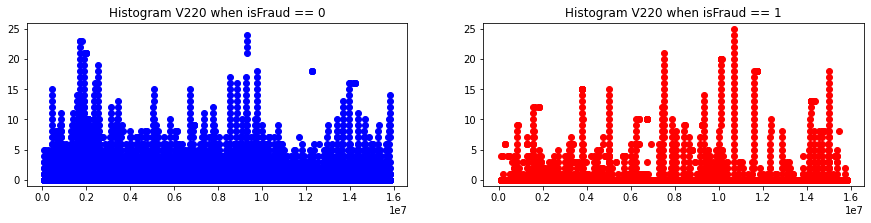

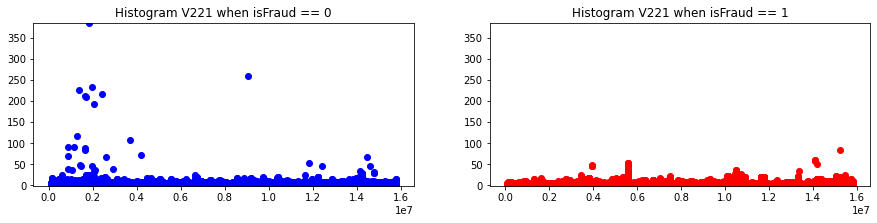

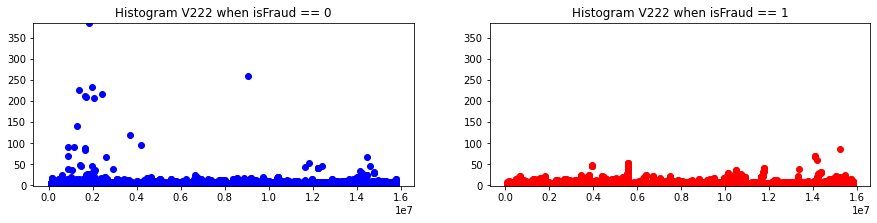

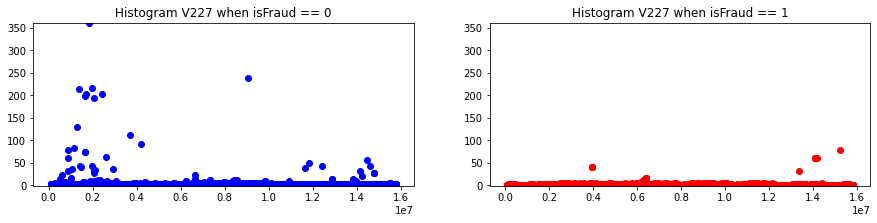

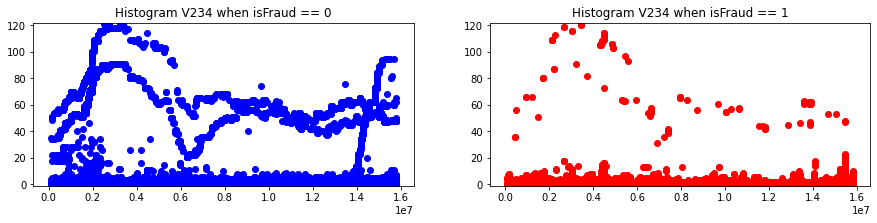

...

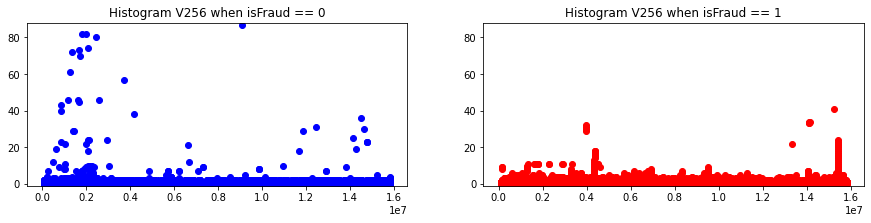

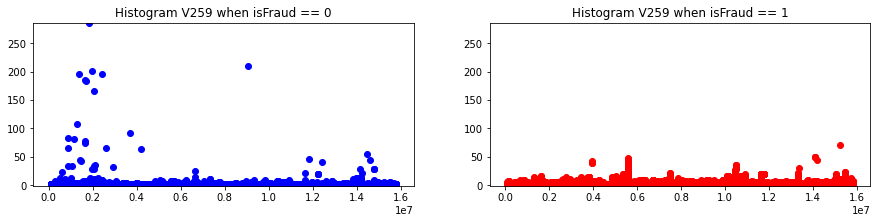

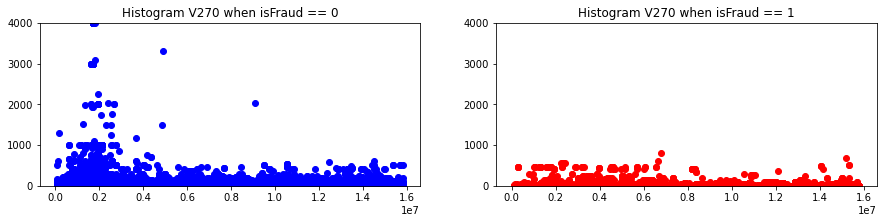

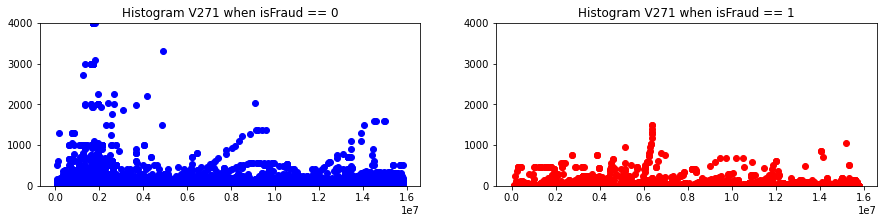

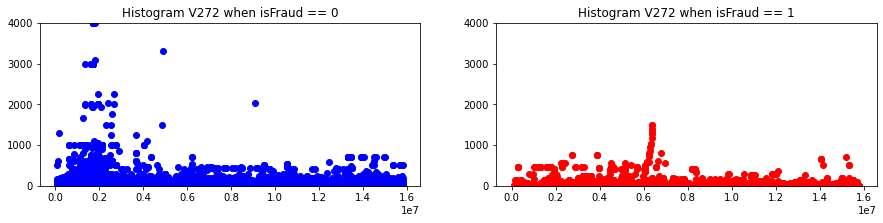

In [65]:
##### Time series graph based on TransactionDT.

group_list = ['V220', 'V221', 'V222', 'V227', 'V234', 'V238', 'V239', 'V245', 'V250', 'V251', 'V255', 'V256', 'V259', 'V270', 'V271', 'V272']

for column in group_list:
    scatter(column)

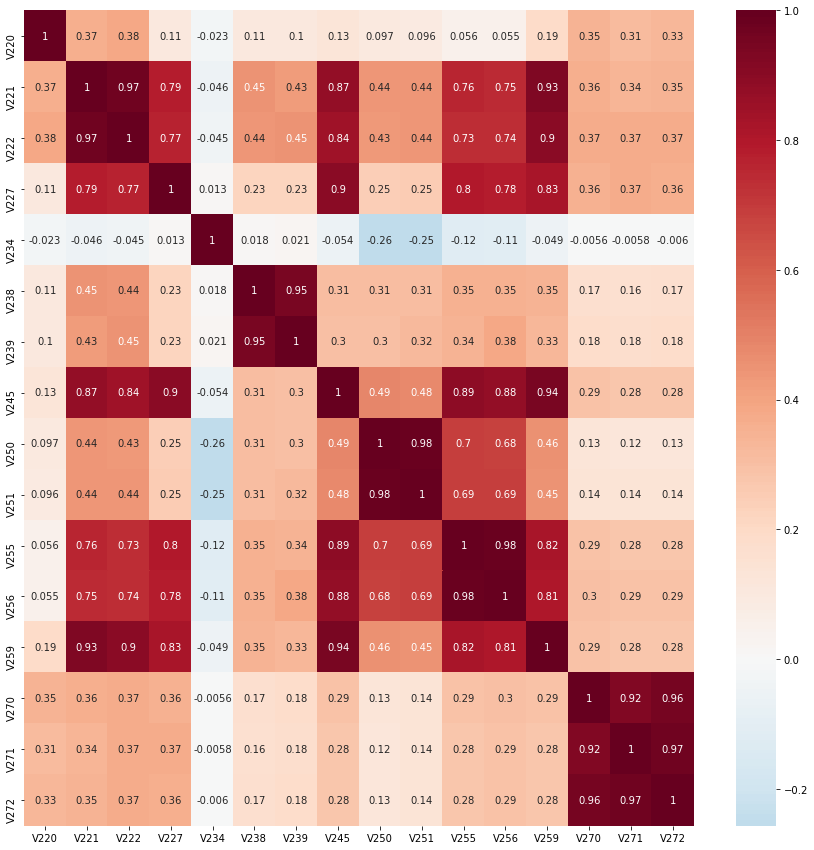

In [66]:
##### Heatmap

plt.figure(figsize = (15,15))
sns.heatmap(train[group_list].corr(), cmap='RdBu_r', annot=True, center=0.0)
plt.show()

In [67]:
##### Ranking of pearson correlation.

for column in group_list:
    corr(group_list,column)
    print(' ')

Correlation with V220
V222    0.382455
V221    0.366391
V270    0.346484
V272    0.331816
V271    0.314465
V259    0.194587
V245    0.132499
V238    0.107867
V227    0.106947
V239    0.104604
V250    0.096680
V251    0.095887
V255    0.055544
V256    0.055060
V234    0.022608
dtype: float64
 
Correlation with V221
V222    0.970040
V259    0.927828
V245    0.872754
V227    0.786910
V255    0.759551
V256    0.745192
V238    0.453415
V250    0.441835
V251    0.435744
V239    0.430239
V220    0.366391
V270    0.364094
V272    0.348773
V271    0.340257
V234    0.046321
dtype: float64
 
Correlation with V222
V221    0.970040
V259    0.901667
V245    0.844196
V227    0.772915
V256    0.736382
V255    0.734925
V239    0.451050
V251    0.444269
V238    0.438201
V250    0.434750
V220    0.382455
V272    0.372704
V270    0.369893
V271    0.369717
V234    0.044962
dtype: float64
 
Correlation with V227
V245    0.901069
V259    0.826610
V255    0.795647
V221    0.786910
V256    0.783825
V222    0.7

In [68]:
##### Based on pearson correlation, we grouped together the columns with corr > 0.7

reduce_groups = ['V220'],['V221','V222','V259','V245','V227','V255','V256'],['V234'],['V238','V239'],['V250','V251'],['V270','V272','V271']

result = reduce(reduce_groups)
final_vcolumns.extend(result)
print('Final V_Group11 columns:',result)

Final V_Group11 columns: ['V220', 'V256', 'V234', 'V239', 'V251', 'V271']


### Group 12

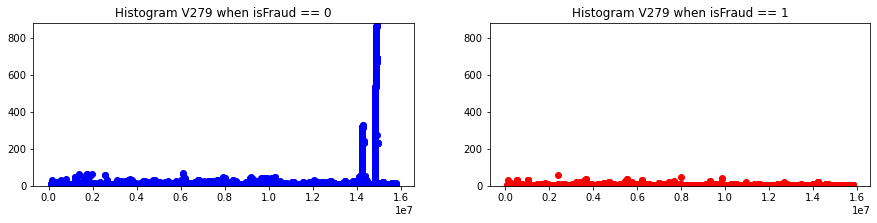

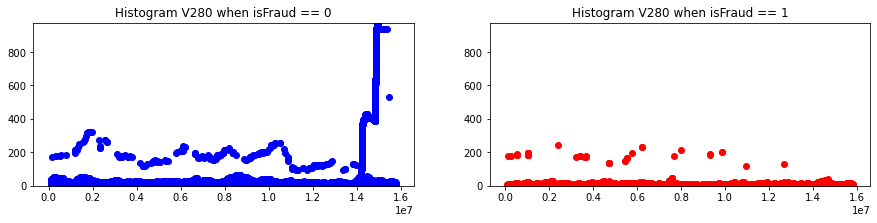

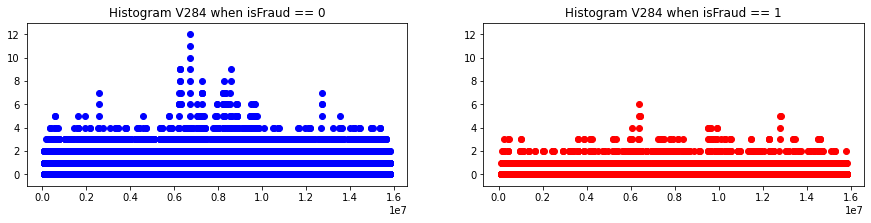

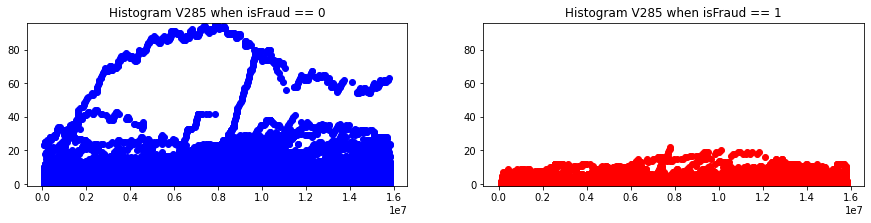

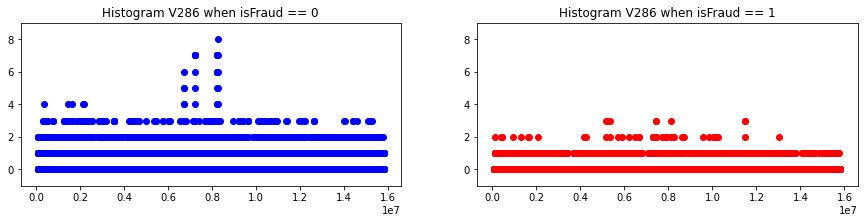

...

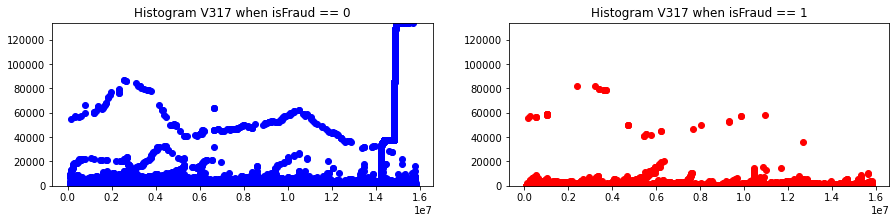

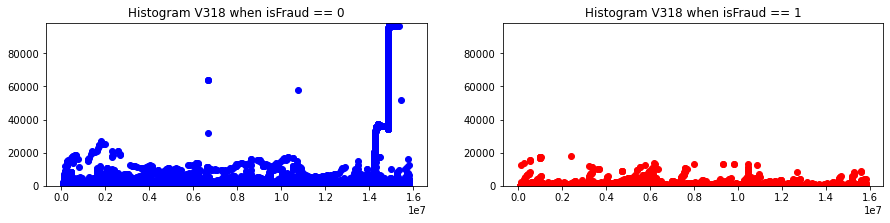

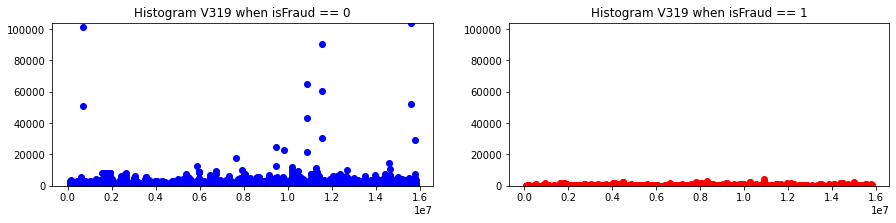

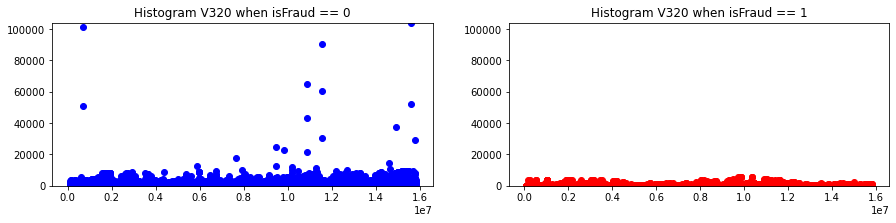

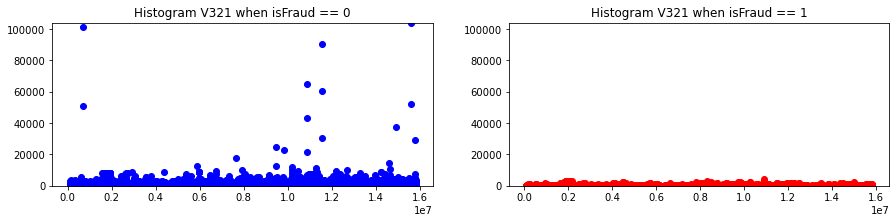

In [69]:
##### Time series graph based on TransactionDT.

group_list = ['V279', 'V280', 'V284', 'V285', 'V286', 'V287', 'V290', 'V291', 'V292', 'V293', 'V294', 'V295', 'V297', 'V298', 'V299', 'V302', 'V303', 'V304',
              'V305', 'V306', 'V307', 'V308', 'V309', 'V310', 'V311', 'V312', 'V316', 'V317', 'V318', 'V319', 'V320', 'V321']

for column in group_list:
    scatter(column)

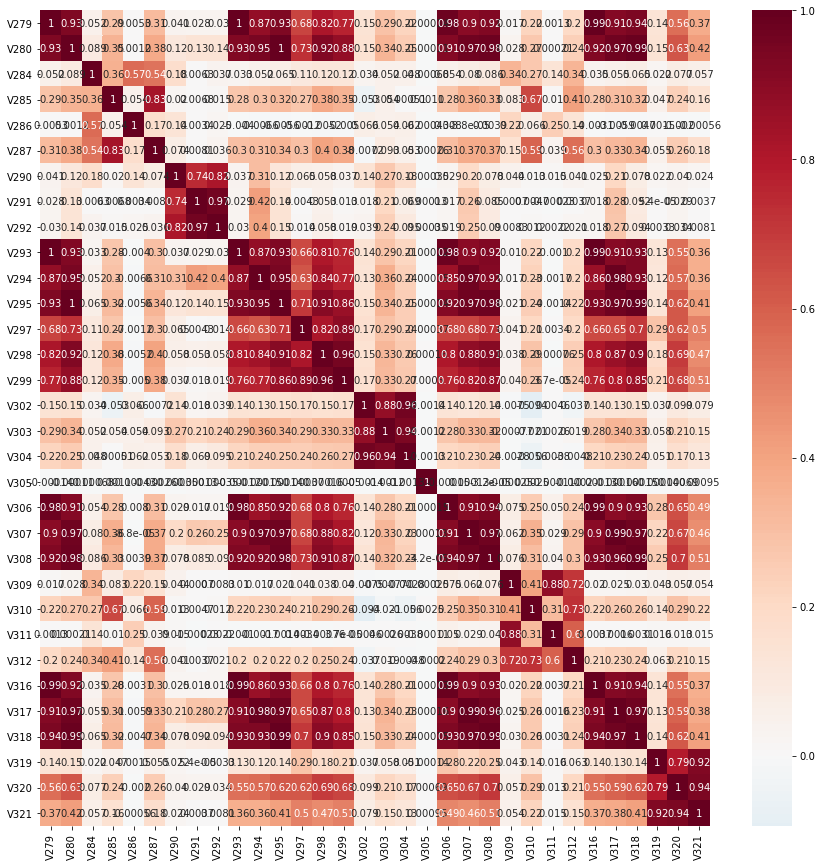

In [70]:
##### Heatmap

plt.figure(figsize = (15,15))
sns.heatmap(train[group_list].corr(), cmap='RdBu_r', annot=True, center=0.0)
plt.show()

In [71]:
##### Ranking of pearson correlation.

for column in group_list:
    corr(group_list,column)
    print(' ')

Correlation with V279
V293    0.999568
V316    0.993526
V306    0.980462
V318    0.936211
V295    0.934333
V280    0.931009
V308    0.923767
V317    0.910417
V307    0.902796
V294    0.873531
V298    0.815242
V299    0.772650
V297    0.675101
V320    0.556290
V321    0.369935
V287    0.314872
V303    0.290875
V285    0.288781
V310    0.221326
V304    0.218145
V312    0.203404
V302    0.145352
V319    0.137288
V284    0.051864
V290    0.041379
V292    0.030087
V291    0.028407
V309    0.016756
V286    0.005320
V311    0.001335
V305    0.000139
dtype: float64
 
Correlation with V280
V295    0.998623
V318    0.990648
V308    0.982476
V317    0.967507
V307    0.965870
V294    0.946095
V279    0.931009
V293    0.926942
V298    0.922176
V316    0.921111
V306    0.912327
V299    0.878577
V297    0.727046
V320    0.627461
V321    0.418978
V287    0.379527
V285    0.349716
V303    0.343358
V310    0.266942
V304    0.253495
V312    0.241836
V302    0.150433
V319    0.146491
V292    0.139419
V291

In [72]:
##### Based on pearson correlation, we grouped together the columns with corr > 0.7

reduce_groups = [['V279','V293','V290','V280','V295','V294','V292','V291','V317','V307','V318'],['V284'],['V285','V287'],['V286'],['V297','V299','V298'],
                ['V302','V304','V303'],['V305'],['V306','V308','V316','V319'],['V309','V311','V312','V310'],['V320','V321']]

result = reduce(reduce_groups)
final_vcolumns.extend(result)
print('Final V_Group12 columns:',result)

Final V_Group12 columns: ['V318', 'V284', 'V287', 'V286', 'V298', 'V303', 'V305', 'V319', 'V310', 'V321']


### Group 13

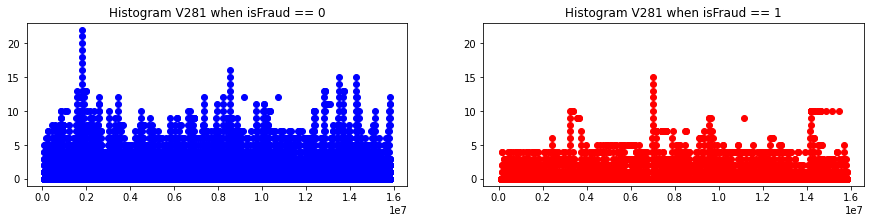

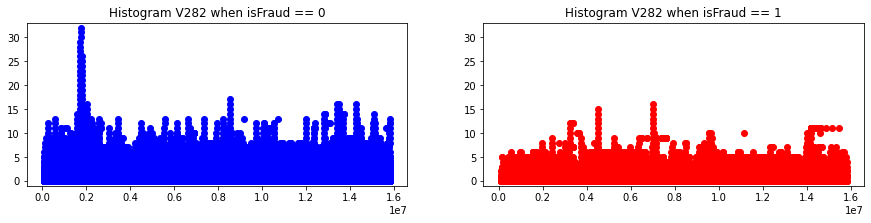

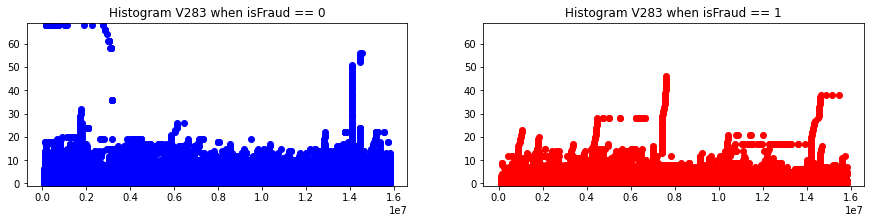

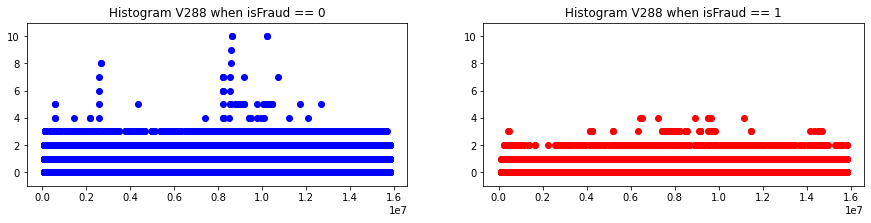

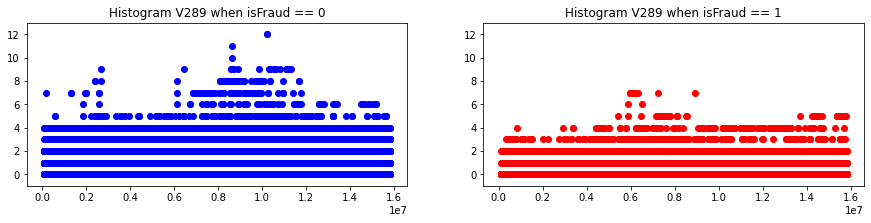

...

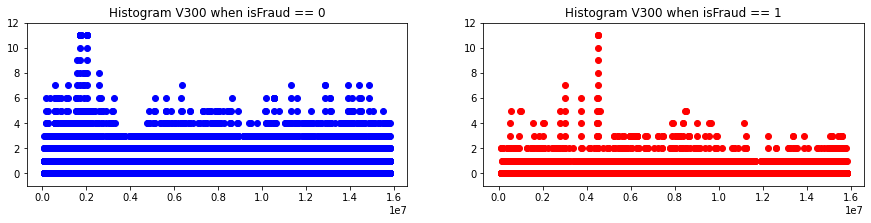

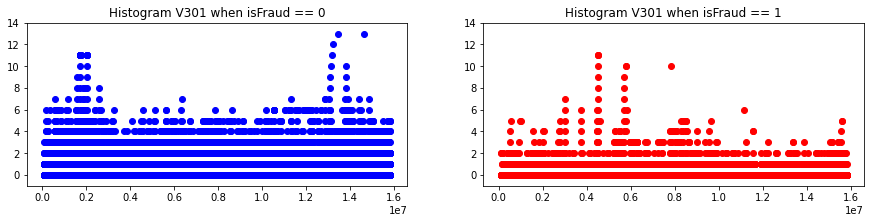

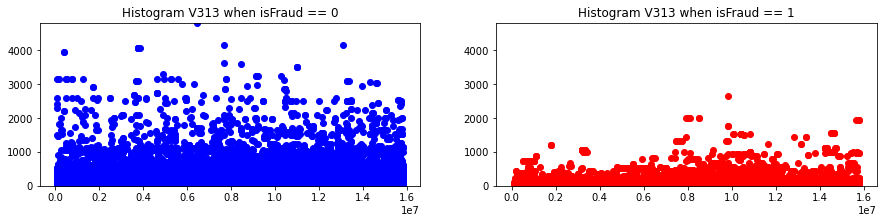

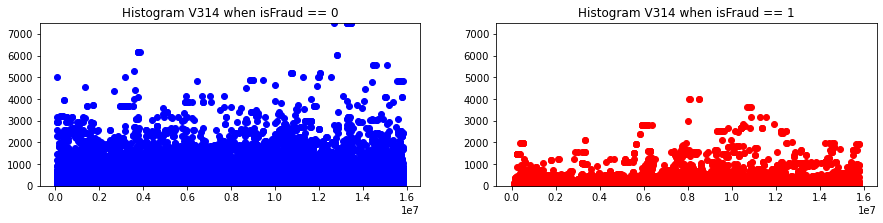

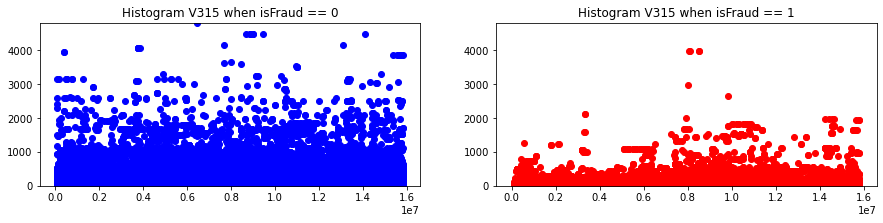

In [73]:
##### Time series graph based on TransactionDT.

group_list = ['V281', 'V282', 'V283', 'V288', 'V289', 'V296', 'V300', 'V301', 'V313', 'V314', 'V315']

for column in group_list:
    scatter(column)

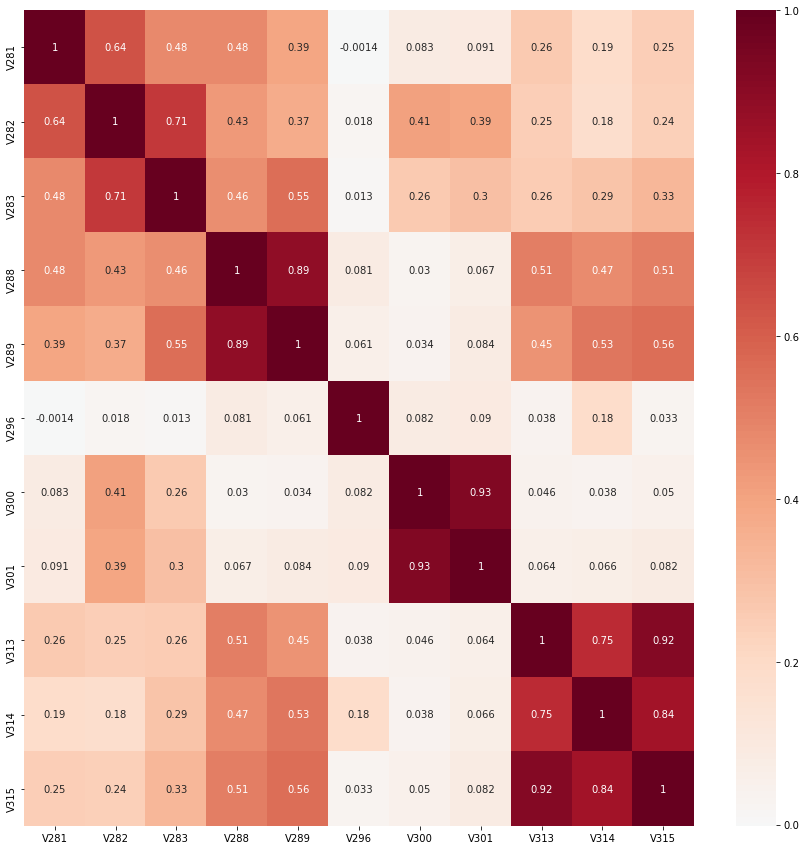

In [74]:
##### Heatmap

plt.figure(figsize = (15,15))
sns.heatmap(train[group_list].corr(), cmap='RdBu_r', annot=True, center=0.0)
plt.show()

In [75]:
##### Ranking of pearson correlation.

for column in group_list:
    corr(group_list,column)
    print(' ')

Correlation with V281
V282    0.636122
V283    0.481994
V288    0.479258
V289    0.390379
V313    0.263350
V315    0.248579
V314    0.188910
V301    0.091323
V300    0.083081
V296    0.001392
dtype: float64
 
Correlation with V282
V283    0.710173
V281    0.636122
V288    0.434590
V300    0.412226
V301    0.393977
V289    0.370126
V313    0.247775
V315    0.240336
V314    0.181681
V296    0.018395
dtype: float64
 
Correlation with V283
V282    0.710173
V289    0.554250
V281    0.481994
V288    0.463950
V315    0.334881
V301    0.302404
V314    0.285854
V300    0.263945
V313    0.255856
V296    0.013238
dtype: float64
 
Correlation with V288
V289    0.888344
V313    0.513608
V315    0.511356
V281    0.479258
V314    0.472119
V283    0.463950
V282    0.434590
V296    0.081163
V301    0.066748
V300    0.030125
dtype: float64
 
Correlation with V289
V288    0.888344
V315    0.560717
V283    0.554250
V314    0.533570
V313    0.449700
V281    0.390379
V282    0.370126
V301    0.083881
V296  

In [76]:
##### Based on pearson correlation, we grouped together the columns with corr > 0.7

reduce_groups = ['V281','V282','V283'],['V288','V289'],['V296'],['V300','V301'],['V313','V315','V314']

result = reduce(reduce_groups)
final_vcolumns.extend(result)
print('Final V_Group13 columns:',result)

Final V_Group13 columns: ['V283', 'V289', 'V296', 'V301', 'V314']


### Group 14

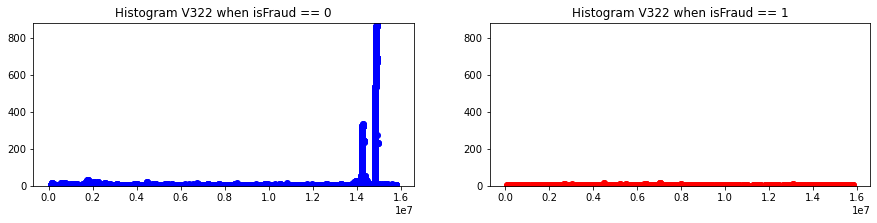

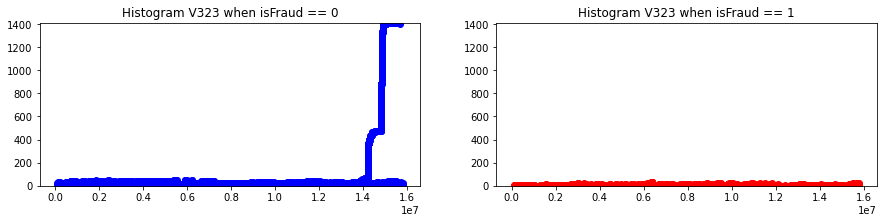

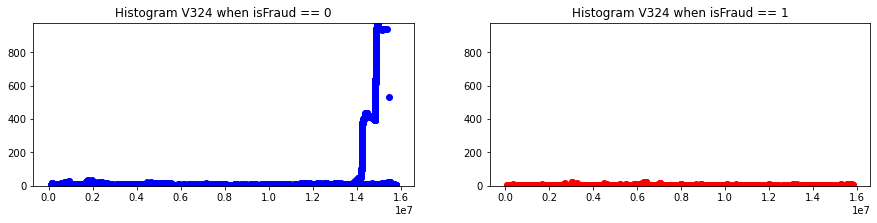

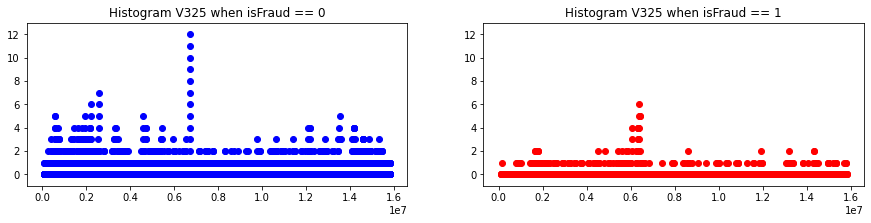

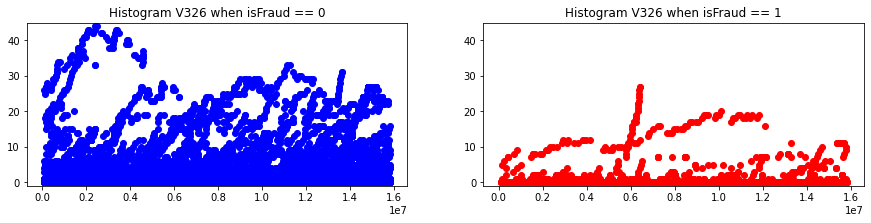

...

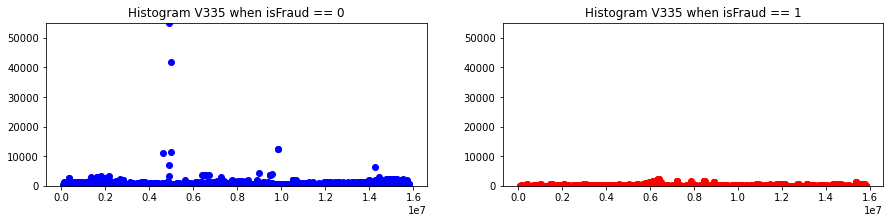

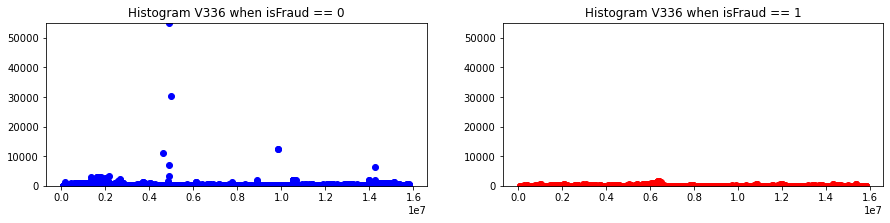

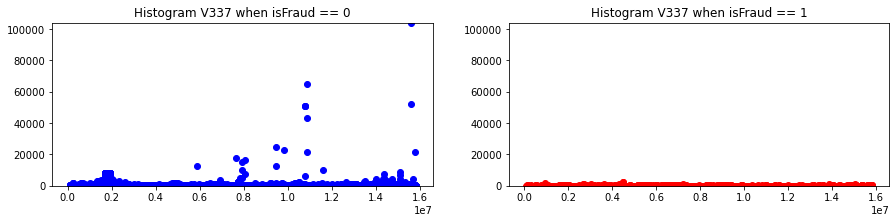

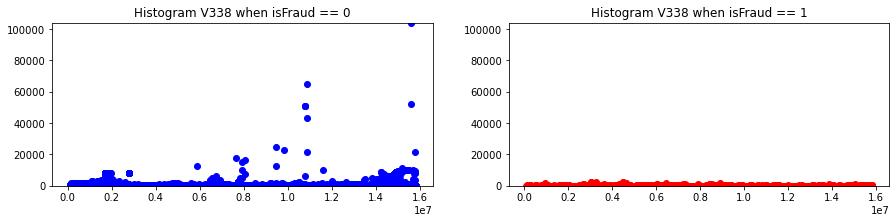

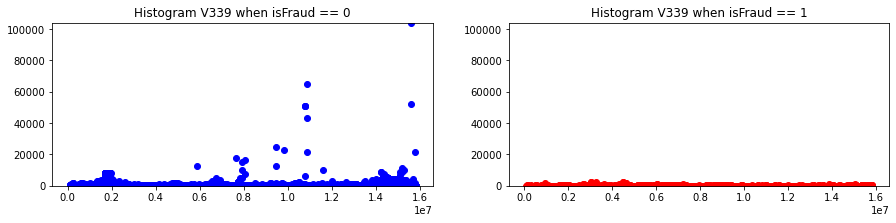

In [77]:
##### Time series graph based on TransactionDT.

group_list = ['V322', 'V323', 'V324', 'V325', 'V326', 'V327', 'V328', 'V329', 'V330', 'V331', 'V332', 'V333', 'V334', 'V335', 'V336', 'V337', 'V338', 'V339']

for column in group_list:
    scatter(column)

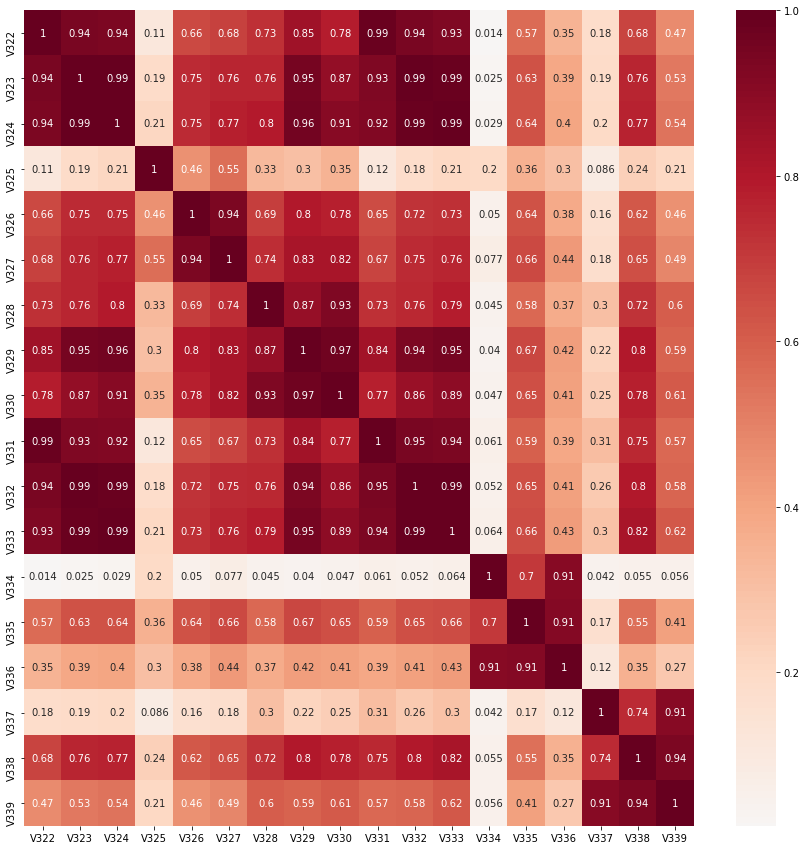

In [78]:
##### Heatmap

plt.figure(figsize = (15,15))
sns.heatmap(train[group_list].corr(), cmap='RdBu_r', annot=True, center=0.0)
plt.show()

In [79]:
##### Ranking of pearson correlation.

for column in group_list:
    corr(group_list,column)
    print(' ')

Correlation with V322
V331    0.986563
V323    0.944680
V332    0.942703
V324    0.936062
V333    0.932696
V329    0.848524
V330    0.781830
V328    0.732846
V327    0.682219
V338    0.678443
V326    0.661089
V335    0.568194
V339    0.471132
V336    0.351582
V337    0.181823
V325    0.111617
V334    0.014451
dtype: float64
 
Correlation with V323
V332    0.994990
V324    0.992720
V333    0.986371
V329    0.950547
V322    0.944680
V331    0.933984
V330    0.874700
V328    0.764127
V327    0.762645
V338    0.759181
V326    0.745004
V335    0.633840
V339    0.525305
V336    0.389819
V325    0.188827
V337    0.188245
V334    0.024835
dtype: float64
 
Correlation with V324
V323    0.992720
V333    0.991333
V332    0.986414
V329    0.960935
V322    0.936062
V331    0.924049
V330    0.905371
V328    0.795705
V327    0.774468
V338    0.767756
V326    0.748075
V335    0.639864
V339    0.544056
V336    0.397213
V325    0.212119
V337    0.196525
V334    0.028794
dtype: float64
 
Correlation with

In [80]:
##### Based on pearson correlation, we grouped together the columns with corr > 0.7

reduce_groups = ['V322','V324'],['V323','V326','V324','V327','V326'],['V325'],['V328','V330','V329'],['V331','V333','V332','V337'],['V334','V336','V335']

result = reduce(reduce_groups)
final_vcolumns.extend(result)
print('Final V_Group14 columns:',result)

Final V_Group14 columns: ['V324', 'V326', 'V325', 'V329', 'V337', 'V335']


### Final V columns

In [81]:
print('Number of V columns:', len(final_vcolumns))
print(final_vcolumns)

Number of V columns: 101
['V1', 'V3', 'V5', 'V7', 'V9', 'V13', 'V14', 'V18', 'V20', 'V24', 'V26', 'V28', 'V30', 'V36', 'V38', 'V52', 'V41', 'V45', 'V47', 'V49', 'V54', 'V56', 'V60', 'V62', 'V65', 'V67', 'V68', 'V70', 'V76', 'V78', 'V81', 'V83', 'V87', 'V88', 'V89', 'V91', 'V101', 'V103', 'V98', 'V105', 'V116', 'V118', 'V121', 'V124', 'V132', 'V134', 'V130', 'V136', 'V138', 'V140', 'V142', 'V166', 'V147', 'V158', 'V162', 'V173', 'V204', 'V214', 'V169', 'V201', 'V175', 'V180', 'V185', 'V189', 'V198', 'V209', 'V246', 'V260', 'V278', 'V237', 'V241', 'V244', 'V273', 'V266', 'V220', 'V256', 'V234', 'V239', 'V251', 'V271', 'V318', 'V284', 'V287', 'V286', 'V298', 'V303', 'V305', 'V319', 'V310', 'V321', 'V283', 'V289', 'V296', 'V301', 'V314', 'V324', 'V326', 'V325', 'V329', 'V337', 'V335']


# Conclusions
Based on previous process, we suggest keeping as final columns the ones describes below:

In [82]:
##### 1st we sort them (ascending order) with a function

final_ccolumns = order_finalcolumns(final_ccolumns)
final_dcolumns = order_finalcolumns(final_dcolumns)
final_mcolumns = order_finalcolumns(final_mcolumns)
final_vcolumns = order_finalcolumns(final_vcolumns)

In [83]:
##### Final columns

print(f'Final Transaction columns ({len(final_transactioncolumns)}): {final_transactioncolumns}')
print(' ')
print(f'Final C columns ({len(final_ccolumns)}): {final_ccolumns}')
print(' ')
print(f'Final D columns ({len(final_dcolumns)}): {final_dcolumns}')
print(' ')
print(f'Final M columns ({len(final_mcolumns)}): {final_mcolumns}')
print(' ')
print(f'Final V columns ({len(final_vcolumns)}): {final_vcolumns}')
print(' ')

print('#' * 50)

final_columns = final_transactioncolumns + final_ccolumns + final_dcolumns + final_mcolumns + final_vcolumns
print(' ')
print('Final columns:', final_columns)
print(' ')
print('Lenght of final columns:', len(final_columns))

Final Transaction columns (15): ['TransactionID', 'isFraud', 'TransactionDT', 'TransactionAmt', 'ProductCD', 'card1', 'card2', 'card3', 'card4', 'card5', 'card6', 'addr1', 'addr2', 'dist1', 'P_emaildomain']
 
Final C columns (3): ['C3', 'C9', 'C13']
 
Final D columns (7): ['D1achr', 'D5', 'D8', 'D9', 'D11achr', 'D13achr', 'D14achr']
 
Final M columns (7): ['M1', 'M3', 'M4', 'M5', 'M6', 'M8', 'M9']
 
Final V columns (101): ['V1', 'V3', 'V5', 'V7', 'V9', 'V13', 'V14', 'V18', 'V20', 'V24', 'V26', 'V28', 'V30', 'V36', 'V38', 'V41', 'V45', 'V47', 'V49', 'V52', 'V54', 'V56', 'V60', 'V62', 'V65', 'V67', 'V68', 'V70', 'V76', 'V78', 'V81', 'V83', 'V87', 'V88', 'V89', 'V91', 'V98', 'V101', 'V103', 'V105', 'V116', 'V118', 'V121', 'V124', 'V130', 'V132', 'V134', 'V136', 'V138', 'V140', 'V142', 'V147', 'V158', 'V162', 'V166', 'V169', 'V173', 'V175', 'V180', 'V185', 'V189', 'V198', 'V201', 'V204', 'V209', 'V214', 'V220', 'V234', 'V237', 'V239', 'V241', 'V244', 'V246', 'V251', 'V256', 'V260', 'V266',